#  PRÁCTICA BICIMAD

Práctica realizada por Ana Sanuy Garabatos, Sergio Moreno González y Tomás Vela Angulo.

### Problema a resolver

En esta práctica se van a utilizar las bases de datos 202106.json y 202106_movements.json, ofrecidas por la empresa de alquiler de bicicletas en Madrid, Bicimad.

La motivación de este proyecto es realizar un análisis de datos y responder algunas preguntas sobre los usuarios de la aplicación y los viajes que han realizado, que podrían ser útiles e interesantes a la hora de querer evaluar cómo va la empresa, tener información para futuras mejoras de la misma o para la posible detección de pérdidas, etc. Estas preguntas se plantearán después de una breve visualización de cómo son las dos bases de datos y se fijarán como nuestro objetivo.

Para ello, se utilizarán las técnicas de procesamiento masivo de datos aprendidas en la asignatura de Big Data, utilizando Spark, impartida por el profesor Luis Llana.


### Introducción

Como hemos comentado, vamos a utilizar Spark, por tanto en primer lugar, nos conectamos a Spark e importamos las librerías que vamos a utilizar a lo largo de la práctica.

In [1]:
# Spark
#====================================================
import pyspark
from pyspark.sql import SparkSession
from pyspark import SparkContext, SparkConf

conf1 = SparkConf().setAppName("Airbnb_AnSeTo")
sc = SparkContext(conf = conf1)

# Operadores
#====================================================
import json
from functools import reduce
from operator import add

# Fechas y horas
#====================================================
from datetime import datetime
from datetime import timezone

# Visualización
#====================================================
#pip install matplotlib
import matplotlib.pyplot as plt


Creamos la función spark para leer los datos como dataframes y observar mejor su estructura.

In [2]:
spark = SparkSession.builder \
    .master("local[1]") \
    .appName("Airbnb_AnSeTo") \
    .getOrCreate()

## Dataset 202106.json
Observemos cómo es la base de datos.

In [3]:
!head -10 202106.json

{"_id": "2021-06-01T00:43:39.688214", "stations": [{"activate": 1, "name": "Puerta del Sol A", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 26, "number": "1a", "longitude": "-3.7018341", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.4172137", "dock_bikes": 3, "id": 1}, {"activate": 1, "name": "Puerta del Sol B", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 28, "number": "1b", "longitude": "-3.701602938060457", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.41731271011562", "dock_bikes": 2, "id": 2}, {"activate": 1, "name": "Miguel Moya", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "2", "longitude": "-3.7058415", "no_available": 0, "address": "Calle Miguel Moya n\u00ba 1", "latitude": "40.4205886", "dock_bikes": 1, "id": 3}, {"activate": 1, "name": "Plaza Conde Suchil", "reservations_count": 0, "light": 1, "total_bases": 18, "free_bases": 2, "n

", "no_available": 0, "address": "Calle Carlota O'Neill n\u00ba 32", "latitude": "40.44370542379883", "dock_bikes": 10, "id": 238}, {"activate": 1, "name": "Derechos Humanos", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "231", "longitude": "-3.6557656204708775", "no_available": 0, "address": "Calle Derechos Humanos n\u00ba 12", "latitude": "40.43965673033275", "dock_bikes": 10, "id": 239}, {"activate": 1, "name": "Jos\u00e9 Mar\u00eda Pereda", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "232", "longitude": "-3.6485306152875148", "no_available": 0, "address": "Calle Jos\u00e9 Mar\u00eda de Pereda n\u00ba 1", "latitude": "40.43272086245887", "dock_bikes": 22, "id": 240}, {"activate": 1, "name": "Marqu\u00e9s de Corbera 12", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "233", "longitude": "-3.6555552857442697", "no_available": 0, "address": "Avenida Marqu\u00e9s de Corbera 

{"_id": "2021-06-01T02:43:42.969250", "stations": [{"activate": 1, "name": "Puerta del Sol A", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 26, "number": "1a", "longitude": "-3.7018341", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.4172137", "dock_bikes": 3, "id": 1}, {"activate": 1, "name": "Puerta del Sol B", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 28, "number": "1b", "longitude": "-3.701602938060457", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.41731271011562", "dock_bikes": 2, "id": 2}, {"activate": 1, "name": "Miguel Moya", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "2", "longitude": "-3.7058415", "no_available": 0, "address": "Calle Miguel Moya n\u00ba 1", "latitude": "40.4205886", "dock_bikes": 1, "id": 3}, {"activate": 1, "name": "Plaza Conde Suchil", "reservations_count": 0, "light": 1, "total_bases": 18, "free_bases": 0, "n

{"_id": "2021-06-01T04:43:45.629938", "stations": [{"activate": 1, "name": "Puerta del Sol A", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 26, "number": "1a", "longitude": "-3.7018341", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.4172137", "dock_bikes": 3, "id": 1}, {"activate": 1, "name": "Puerta del Sol B", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 28, "number": "1b", "longitude": "-3.701602938060457", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.41731271011562", "dock_bikes": 2, "id": 2}, {"activate": 1, "name": "Miguel Moya", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "2", "longitude": "-3.7058415", "no_available": 0, "address": "Calle Miguel Moya n\u00ba 1", "latitude": "40.4205886", "dock_bikes": 1, "id": 3}, {"activate": 1, "name": "Plaza Conde Suchil", "reservations_count": 0, "light": 1, "total_bases": 18, "free_bases": 0, "n

{"_id": "2021-06-01T05:43:48.640363", "stations": [{"activate": 1, "name": "Puerta del Sol A", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 26, "number": "1a", "longitude": "-3.7018341", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.4172137", "dock_bikes": 3, "id": 1}, {"activate": 1, "name": "Puerta del Sol B", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 28, "number": "1b", "longitude": "-3.701602938060457", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.41731271011562", "dock_bikes": 2, "id": 2}, {"activate": 1, "name": "Miguel Moya", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "2", "longitude": "-3.7058415", "no_available": 0, "address": "Calle Miguel Moya n\u00ba 1", "latitude": "40.4205886", "dock_bikes": 1, "id": 3}, {"activate": 1, "name": "Plaza Conde Suchil", "reservations_count": 0, "light": 1, "total_bases": 18, "free_bases": 0, "n

{"_id": "2021-06-01T08:43:53.071217", "stations": [{"activate": 1, "name": "Puerta del Sol A", "reservations_count": 1, "light": 0, "total_bases": 30, "free_bases": 26, "number": "1a", "longitude": "-3.7018341", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.4172137", "dock_bikes": 2, "id": 1}, {"activate": 1, "name": "Puerta del Sol B", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 28, "number": "1b", "longitude": "-3.701602938060457", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.41731271011562", "dock_bikes": 2, "id": 2}, {"activate": 1, "name": "Miguel Moya", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "2", "longitude": "-3.7058415", "no_available": 0, "address": "Calle Miguel Moya n\u00ba 1", "latitude": "40.4205886", "dock_bikes": 1, "id": 3}, {"activate": 1, "name": "Plaza Conde Suchil", "reservations_count": 1, "light": 2, "total_bases": 18, "free_bases": 5, "n

{"_id": "2021-06-01T09:43:55.262773", "stations": [{"activate": 1, "name": "Puerta del Sol A", "reservations_count": 1, "light": 0, "total_bases": 30, "free_bases": 24, "number": "1a", "longitude": "-3.7018341", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.4172137", "dock_bikes": 5, "id": 1}, {"activate": 1, "name": "Puerta del Sol B", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 26, "number": "1b", "longitude": "-3.701602938060457", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.41731271011562", "dock_bikes": 4, "id": 2}, {"activate": 1, "name": "Miguel Moya", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "2", "longitude": "-3.7058415", "no_available": 0, "address": "Calle Miguel Moya n\u00ba 1", "latitude": "40.4205886", "dock_bikes": 1, "id": 3}, {"activate": 1, "name": "Plaza Conde Suchil", "reservations_count": 0, "light": 2, "total_bases": 18, "free_bases": 9, "n

Es una base de datos en la que están recogidas cada hora de cada día del mes de junio de 2021, y en cada una de esas horas se recogen los datos de las 264 estaciones de bicicletas de la empresa Bicimad

Veamos cómo es uno de los elementos.

In [4]:
a='{"_id": "2021-06-01T00:43:39.688214", "stations": [{"activate": 1, "name": "Puerta del Sol A", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 26, "number": "1a", "longitude": "-3.7018341", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.4172137", "dock_bikes": 3, "id": 1}, {"activate": 1, "name": "Puerta del Sol B", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 28, "number": "1b", "longitude": "-3.701602938060457", "no_available": 0, "address": "Puerta del Sol n\u00ba 1", "latitude": "40.41731271011562", "dock_bikes": 2, "id": 2}, {"activate": 1, "name": "Miguel Moya", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "2", "longitude": "-3.7058415", "no_available": 0, "address": "Calle Miguel Moya n\u00ba 1", "latitude": "40.4205886", "dock_bikes": 1, "id": 3}, {"activate": 1, "name": "Plaza Conde Suchil", "reservations_count": 0, "light": 1, "total_bases": 18, "free_bases": 2, "number": "3", "longitude": "-3.7069171", "no_available": 0, "address": "Plaza del Conde del Valle de S\u00fachil n\u00ba 3", "latitude": "40.4302937", "dock_bikes": 12, "id": 4}, {"activate": 1, "name": "Malasa\u00f1a", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "4", "longitude": "-3.7025875", "no_available": 0, "address": "Calle Manuela Malasa\u00f1a n\u00ba 5", "latitude": "40.4285524", "dock_bikes": 7, "id": 5}, {"activate": 1, "name": "Fuencarral", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 20, "number": "5", "longitude": "-3.70205", "no_available": 0, "address": "Calle Fuencarral n\u00ba 108", "latitude": "40.42852", "dock_bikes": 4, "id": 6}, {"activate": 1, "name": "Colegio Arquitectos", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "6", "longitude": "-3.6984470", "no_available": 0, "address": "Calle Hortaleza n\u00ba 63", "latitude": "40.4241480", "dock_bikes": 7, "id": 7}, {"activate": 1, "name": "Hortaleza", "reservations_count": 0, "light": 2, "total_bases": 21, "free_bases": 11, "number": "7", "longitude": "-3.6977715", "no_available": 0, "address": "Calle Hortaleza n\u00ba 75", "latitude": "40.4251906", "dock_bikes": 9, "id": 8}, {"activate": 1, "name": "Alonso Mart\u00ednez", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "8", "longitude": "-3.6954403", "no_available": 0, "address": "Plaza de Alonso Mart\u00ednez n\u00ba 5", "latitude": "40.4278682", "dock_bikes": 2, "id": 9}, {"activate": 1, "name": "Plaza de San Miguel", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 4, "number": "9", "longitude": "-3.7095084", "no_available": 0, "address": "Plaza de San Miguel n\u00ba 9", "latitude": "40.4156057", "dock_bikes": 18, "id": 10}, {"activate": 1, "name": "Marqu\u00e9s de la Ensenada", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "10", "longitude": "-3.69214", "no_available": 0, "address": "Calle Marqu\u00e9s de la Ensenada n\u00ba 16", "latitude": "40.42533", "dock_bikes": 0, "id": 11}, {"activate": 1, "name": "San Andr\u00e9s", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "11", "longitude": "-3.7035918", "no_available": 0, "address": "Calle San Andr\u00e9s n\u00ba 18", "latitude": "40.4269483", "dock_bikes": 4, "id": 12}, {"activate": 1, "name": "San Hermenegildo", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "12", "longitude": "-3.7061931", "no_available": 0, "address": "Calle San Bernardo n\u00ba 85", "latitude": "40.4284246", "dock_bikes": 9, "id": 13}, {"activate": 1, "name": "Conde Duque", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "13", "longitude": "-3.7104417", "no_available": 0, "address": "Calle Conde Duque n\u00ba 22", "latitude": "40.4273264", "dock_bikes": 17, "id": 14}, {"activate": 1, "name": "Ventura Rodr\u00edguez", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 12, "number": "14", "longitude": "-3.7134790", "no_available": 0, "address": "Calle Duque de Liria", "latitude": "40.4260957", "dock_bikes": 12, "id": 15}, {"activate": 1, "name": "San Vicente Ferrer", "reservations_count": 0, "light": 2, "total_bases": 21, "free_bases": 11, "number": "15", "longitude": "-3.7074453", "no_available": 0, "address": "Calle San Vicente Ferrer n\u00ba 64", "latitude": "40.4262383", "dock_bikes": 9, "id": 16}, {"activate": 1, "name": "San Bernardo", "reservations_count": 0, "light": 0, "total_bases": 21, "free_bases": 13, "number": "16", "longitude": "-3.7075065", "no_available": 0, "address": "Calle San Bernardo n\u00ba 22", "latitude": "40.4230721", "dock_bikes": 3, "id": 17}, {"activate": 1, "name": "Carlos Cambronero", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "17", "longitude": "-3.7038312", "no_available": 0, "address": "Plaza de Carlos Cambronero n\u00ba 2", "latitude": "40.4232649", "dock_bikes": 10, "id": 18}, {"activate": 1, "name": "Plaza de Pedro Zerolo", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "18", "longitude": "-3.6996502", "no_available": 0, "address": "Plaza de Pedro Zerolo n\u00ba 1", "latitude": "40.4207773", "dock_bikes": 8, "id": 19}, {"activate": 1, "name": "Prim", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "19", "longitude": "-3.6954983", "no_available": 0, "address": "Calle Prim n\u00ba 2", "latitude": "40.4218616", "dock_bikes": 1, "id": 20}, {"activate": 1, "name": "Banco de Espa\u00f1a A", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 29, "number": "20a", "longitude": "-3.6954615", "no_available": 0, "address": "Calle Alcal\u00e1 n\u00ba 49", "latitude": "40.4192342", "dock_bikes": 1, "id": 21}, {"activate": 1, "name": "Jacometrezo", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "22", "longitude": "-3.7065376", "no_available": 0, "address": "Calle Jacometrezo n\u00ba 3", "latitude": "40.4200783", "dock_bikes": 2, "id": 25}, {"activate": 1, "name": "Santo Domingo", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "23", "longitude": "-3.7081246", "no_available": 0, "address": "Plaza de Santo Domingo n\u00ba 1", "latitude": "40.4202834", "dock_bikes": 2, "id": 26}, {"activate": 1, "name": "Palacio de Oriente", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "24", "longitude": "-3.710692", "no_available": 0, "address": "Calle Carlos III n\u00ba 1", "latitude": "40.417908", "dock_bikes": 1, "id": 27}, {"activate": 1, "name": "Plaza de Celenque A", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "25a", "longitude": "-3.7057791", "no_available": 0, "address": "Plaza de Celenque n\u00ba 1", "latitude": "40.4173703", "dock_bikes": 1, "id": 28}, {"activate": 1, "name": "Plaza de Celenque B", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "25b", "longitude": "-3.7063837", "no_available": 0, "address": "Plaza de Celenque n\u00ba 1", "latitude": "40.4172781", "dock_bikes": 2, "id": 29}, {"activate": 1, "name": "Plaza de las Salesas", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 15, "number": "26", "longitude": "-3.694475", "no_available": 0, "address": "Plaza de las Salesas 7", "latitude": "40.423855", "dock_bikes": 6, "id": 30}, {"activate": 1, "name": "Huertas", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 6, "number": "27", "longitude": "-3.6956178", "no_available": 0, "address": "Calle Jes\u00fas n\u00ba 1", "latitude": "40.4132798", "dock_bikes": 12, "id": 31}, {"activate": 1, "name": "Sevilla", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "28", "longitude": "-3.6984368", "no_available": 0, "address": "Calle Alcal\u00e1 n\u00ba 27", "latitude": "40.4181518", "dock_bikes": 3, "id": 32}, {"activate": 1, "name": "Marqu\u00e9s de Cubas", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "29", "longitude": "-3.6957355", "no_available": 0, "address": "Calle del Marqu\u00e9s de Cubas n\u00ba 25", "latitude": "40.4162619", "dock_bikes": 2, "id": 33}, {"activate": 1, "name": "San Quint\u00edn", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 21, "number": "30", "longitude": "-3.7115040", "no_available": 0, "address": "Calle Pav\u00eda n\u00ba 6", "latitude": "40.4192095", "dock_bikes": 5, "id": 34}, {"activate": 1, "name": "Calle Mayor", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 22, "number": "31", "longitude": "-3.7068969", "no_available": 0, "address": "Calle Mayor n\u00ba 20", "latitude": "40.4163638", "dock_bikes": 4, "id": 35}, {"activate": 1, "name": "Plaza de la Provincia", "reservations_count": 0, "light": 2, "total_bases": 18, "free_bases": 5, "number": "32", "longitude": "-3.7061032", "no_available": 0, "address": "Plaza de la Provincia n\u00ba 1", "latitude": "40.4150099", "dock_bikes": 8, "id": 36}, {"activate": 1, "name": "Carretas", "reservations_count": 0, "light": 0, "total_bases": 21, "free_bases": 18, "number": "33", "longitude": "-3.7030833", "no_available": 0, "address": "Calle Carretas n\u00ba 8", "latitude": "40.4165039", "dock_bikes": 1, "id": 37}, {"activate": 1, "name": "Jacinto Benavente", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "34", "longitude": "-3.7036825", "no_available": 0, "address": "Plaza de Jacinto Benavente", "latitude": "40.4146755", "dock_bikes": 23, "id": 38}, {"activate": 1, "name": "Plaza del Cord\u00f3n", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "35", "longitude": "-3.7103285", "no_available": 0, "address": "Plaza del Cord\u00f3n", "latitude": "40.4141931", "dock_bikes": 20, "id": 39}, {"activate": 1, "name": "Plaza Ramales", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "36", "longitude": "-3.71183", "no_available": 0, "address": "Plaza de Ramales", "latitude": "40.4168", "dock_bikes": 8, "id": 40}, {"activate": 1, "name": "Plaza de San Francisco", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "37", "longitude": "-3.7144964", "no_available": 0, "address": "Plaza de San Francisco n\u00ba 5", "latitude": "40.4108442", "dock_bikes": 24, "id": 41}, {"activate": 1, "name": "Plaza de los Carros", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "38", "longitude": "-3.7114762", "no_available": 0, "address": "Carrera de San Francisco n\u00ba 1", "latitude": "40.4114041", "dock_bikes": 23, "id": 42}, {"activate": 1, "name": "Plaza de la Cebada", "reservations_count": 0, "light": 1, "total_bases": 27, "free_bases": 2, "number": "39", "longitude": "-3.7088337", "no_available": 0, "address": "Plaza de la Cebada n\u00ba 16 ", "latitude": "40.4112744", "dock_bikes": 25, "id": 43}, {"activate": 1, "name": "Conde de Romanones", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "40", "longitude": "-3.7049407", "no_available": 0, "address": "Plaza del Conde de Romanones n\u00ba 9", "latitude": "40.4138846", "dock_bikes": 19, "id": 44}, {"activate": 1, "name": "Ant\u00f3n Mart\u00edn", "reservations_count": 0, "light": 1, "total_bases": 18, "free_bases": 1, "number": "41", "longitude": "-3.6991147", "no_available": 0, "address": "Calle Atocha n\u00ba 54", "latitude": "40.4122047", "dock_bikes": 16, "id": 45}, {"activate": 1, "name": "Santa Isabel", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "42", "longitude": "-3.6982318", "no_available": 0, "address": "Calle Atocha n\u00ba 95", "latitude": "40.4107085", "dock_bikes": 20, "id": 46}, {"activate": 1, "name": "Jes\u00fas y Mar\u00eda", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "43", "longitude": "-3.7025024", "no_available": 0, "address": "Calle Lavapi\u00e9s n\u00ba 34", "latitude": "40.4101564", "dock_bikes": 16, "id": 47}, {"activate": 1, "name": "Plaza de Nelson Mandela", "reservations_count": 0, "light": 1, "total_bases": 21, "free_bases": 5, "number": "44", "longitude": "-3.7040666", "no_available": 0, "address": "Calle Mes\u00f3n de Paredes n\u00ba 35", "latitude": "40.4097617", "dock_bikes": 15, "id": 48}, {"activate": 1, "name": "Puerta de Toledo", "reservations_count": 0, "light": 1, "total_bases": 21, "free_bases": 3, "number": "45", "longitude": "-3.7110513", "no_available": 0, "address": "Glorieta de la Puerta de Toledo n\u00ba 1", "latitude": "40.4070358", "dock_bikes": 18, "id": 49}, {"activate": 1, "name": "Ribera de Curtidores", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 4, "number": "46", "longitude": "-3.7071259", "no_available": 0, "address": "Calle Ribera de Curtidores n\u00ba 28", "latitude": "40.4053153", "dock_bikes": 19, "id": 50}, {"activate": 1, "name": "Embajadores 1", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "47", "longitude": "-3.7028265", "no_available": 0, "address": "Glorieta de Embajadores n\u00ba 6", "latitude": "40.4047851", "dock_bikes": 11, "id": 51}, {"activate": 1, "name": "Embajadores 2", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "48", "longitude": "-3.7022591", "no_available": 0, "address": "Glorieta de Embajadores n\u00ba 2", "latitude": "40.4056107", "dock_bikes": 11, "id": 52}, {"activate": 1, "name": "Casa Encendida", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "49", "longitude": "-3.6992759", "no_available": 0, "address": "Ronda de Atocha n\u00ba 34", "latitude": "40.4060941", "dock_bikes": 22, "id": 53}, {"activate": 1, "name": "Museo Reina Sof\u00eda", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "50", "longitude": "-3.6933463", "no_available": 0, "address": "Calle Santa Isabel n\u00ba 57", "latitude": "40.4083684", "dock_bikes": 6, "id": 54}, {"activate": 1, "name": "Ronda de Atocha", "reservations_count": 0, "light": 2, "total_bases": 27, "free_bases": 17, "number": "51", "longitude": "-3.6935205", "no_available": 0, "address": "Ronda de Atocha n\u00ba 2", "latitude": "40.4075606", "dock_bikes": 9, "id": 55}, {"activate": 1, "name": "Plaza de Santa Ana", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "52", "longitude": "-3.7007164", "no_available": 0, "address": "Plaza de Santa Ana n\u00ba 10", "latitude": "40.4144226", "dock_bikes": 14, "id": 56}, {"activate": 1, "name": "Plaza de Lavapi\u00e9s", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "53", "longitude": "-3.7007111", "no_available": 0, "address": "Calle Valencia n\u00ba 1", "latitude": "40.4083061", "dock_bikes": 19, "id": 57}, {"activate": 1, "name": "Barcel\u00f3", "reservations_count": 0, "light": 2, "total_bases": 21, "free_bases": 11, "number": "54", "longitude": "-3.7004230", "no_available": 0, "address": "Calle Barcel\u00f3 n\u00ba 7", "latitude": "40.4266828", "dock_bikes": 6, "id": 58}, {"activate": 1, "name": "Plaza de San Ildefonso", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "55", "longitude": "-3.7020842", "no_available": 0, "address": "Plaza de San Ildefonso", "latitude": "40.4239757", "dock_bikes": 10, "id": 59}, {"activate": 1, "name": "Plaza del Carmen ", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "56", "longitude": "-3.7032414", "no_available": 0, "address": "Plaza del Carmen n\u00ba 1", "latitude": "40.4184192", "dock_bikes": 4, "id": 60}, {"activate": 1, "name": "Santa Cruz del Marcenado", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "57", "longitude": "-3.7126299", "no_available": 0, "address": "Calle Santa Cruz del Marcenado n\u00ba 24", "latitude": "40.4295658", "dock_bikes": 9, "id": 61}, {"activate": 1, "name": "Augusto Figueroa", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "58", "longitude": "-3.6978950", "no_available": 0, "address": "Calle Augusto Figueroa n\u00ba 33", "latitude": "40.4222862", "dock_bikes": 19, "id": 62}, {"activate": 1, "name": "Plaza de Juan Pujol", "reservations_count": 0, "light": 1, "total_bases": 21, "free_bases": 5, "number": "59", "longitude": "-3.7043418", "no_available": 0, "address": "Calle Esp\u00edritu Santo n\u00ba 30", "latitude": "40.4255495", "dock_bikes": 14, "id": 63}, {"activate": 1, "name": "Plaza de la Independencia", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "60", "longitude": "-3.6883980", "no_available": 0, "address": "Plaza de la Independencia n\u00ba 6", "latitude": "40.4197520", "dock_bikes": 2, "id": 64}, {"activate": 1, "name": "Narv\u00e1ez", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "61", "longitude": "-3.6752045", "no_available": 0, "address": "Calle ODonnell n\u00ba 28", "latitude": "40.4213983", "dock_bikes": 4, "id": 65}, {"activate": 1, "name": "ODonnell", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "62", "longitude": "-3.6724968", "no_available": 0, "address": "Calle ODonnell n\u00ba 50", "latitude": "40.4213148", "dock_bikes": 2, "id": 66}, {"activate": 1, "name": "Ibiza", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 16, "number": "63", "longitude": "-3.6708959", "no_available": 0, "address": "Calle Ibiza n\u00ba 62", "latitude": "40.4179237", "dock_bikes": 7, "id": 67}, {"activate": 1, "name": "Antonio Maura", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "65", "longitude": "-3.6894193", "no_available": 0, "address": "Calle Antonio Maura n\u00ba 15", "latitude": "40.4166834", "dock_bikes": 2, "id": 69}, {"activate": 1, "name": "Almad\u00e9n", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 16, "number": "67", "longitude": "-3.6932250", "no_available": 0, "address": "Calle Almad\u00e9n n\u00ba 28", "latitude": "40.4108472", "dock_bikes": 7, "id": 71}, {"activate": 1, "name": "Espalter", "reservations_count": 0, "light": 0, "total_bases": 21, "free_bases": 17, "number": "68", "longitude": "-3.6912023", "no_available": 0, "address": "Calle Espalter n\u00ba 1", "latitude": "40.4128372", "dock_bikes": 3, "id": 72}, {"activate": 1, "name": "Puerta del \u00c1ngel Ca\u00eddo", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 21, "number": "69", "longitude": "-3.6888220", "no_available": 0, "address": "Avenida de Alfonso XII n\u00ba 54", "latitude": "40.4098080", "dock_bikes": 3, "id": 73}, {"activate": 1, "name": "Puerta del Doce de Octubre", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "70", "longitude": "-3.6779232", "no_available": 0, "address": "Avenida de Men\u00e9ndez Pelayo n\u00ba 63", "latitude": "40.4153053", "dock_bikes": 1, "id": 74}, {"activate": 1, "name": "Doce de Octubre", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 4, "number": "71", "longitude": "-3.6738865", "no_available": 0, "address": "Calle Doce de Octubre n\u00ba 28", "latitude": "40.4159569", "dock_bikes": 17, "id": 75}, {"activate": 1, "name": "Sainz de Baranda", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "72", "longitude": "-3.6691838", "no_available": 0, "address": "Calle Doctor Esquerdo n\u00ba 99", "latitude": "40.4157413", "dock_bikes": 5, "id": 76}, {"activate": 1, "name": "Plaza de los Astros", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "73", "longitude": "-3.6689089", "no_available": 0, "address": "Avenida de Nazaret n\u00ba 7", "latitude": "40.4114475", "dock_bikes": 19, "id": 77}, {"activate": 1, "name": "Puerta del Pac\u00edfico ", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 8, "number": "74", "longitude": "-3.6766813", "no_available": 0, "address": "Avenida de Men\u00e9ndez Pelayo n\u00ba 73", "latitude": "40.4117627", "dock_bikes": 14, "id": 78}, {"activate": 1, "name": "Men\u00e9ndez Pelayo", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "75", "longitude": "-3.6784838", "no_available": 0, "address": "Avenida de Men\u00e9ndez Pelayo con calle Poeta Esteban Villegas", "latitude": "40.4082805", "dock_bikes": 24, "id": 79}, {"activate": 1, "name": "Puerta de Mariano de Cavia", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "76", "longitude": "-3.6751352", "no_available": 0, "address": "Avenida del Mediterr\u00e1neo n\u00ba 19", "latitude": "40.4071304", "dock_bikes": 16, "id": 80}, {"activate": 1, "name": "Conde de Casal", "reservations_count": 0, "light": 1, "total_bases": 22, "free_bases": 5, "number": "77", "longitude": "-3.6704220", "no_available": 0, "address": "Plaza del Conde de Casal n\u00ba 8", "latitude": "40.4063500", "dock_bikes": 16, "id": 81}, {"activate": 1, "name": "Pedro Bosch", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "78", "longitude": "-3.674400", "no_available": 0, "address": "Calle Cerro de la Plata n\u00ba 2", "latitude": "40.400789", "dock_bikes": 17, "id": 82}, {"activate": 1, "name": "Puerta de Granada", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 6, "number": "79", "longitude": "-3.6803874", "no_available": 0, "address": "Avenida de Men\u00e9ndez Pelayo n\u00ba 38", "latitude": "40.4051451", "dock_bikes": 16, "id": 83}, {"activate": 1, "name": "Atocha A", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "80a", "longitude": "-3.6902255", "no_available": 0, "address": "Paseo de la Infanta Isabel n\u00ba 3", "latitude": "40.4075685", "dock_bikes": 9, "id": 84}, {"activate": 1, "name": "Atocha B", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 17, "number": "80b", "longitude": "-3.6901234", "no_available": 0, "address": "Paseo de la Infanta Isabel n\u00ba 3", "latitude": "40.4074902", "dock_bikes": 5, "id": 85}, {"activate": 1, "name": "Cuesta de Moyano", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "81", "longitude": "-3.6919870", "no_available": 0, "address": "Cuesta de Claudio Moyano", "latitude": "40.4092970", "dock_bikes": 9, "id": 86}, {"activate": 1, "name": "Ni\u00f1o Jes\u00fas", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 16, "number": "82", "longitude": "-3.6697526", "no_available": 0, "address": "Calle Doctor Esquerdo n\u00ba 161", "latitude": "40.4084556", "dock_bikes": 8, "id": 87}, {"activate": 1, "name": "P\u00edo Baroja", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "83", "longitude": "-3.6745323", "no_available": 0, "address": "Calle P\u00edo Baroja n\u00ba 10", "latitude": "40.4132995", "dock_bikes": 12, "id": 88}, {"activate": 1, "name": "Valderribas", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 4, "number": "84", "longitude": "-3.6726019", "no_available": 0, "address": "Calle Doctor Esquerdo n\u00ba 191", "latitude": "40.4032501", "dock_bikes": 16, "id": 89}, {"activate": 1, "name": "Puerta de Madrid", "reservations_count": 0, "light": 2, "total_bases": 27, "free_bases": 13, "number": "85", "longitude": "-3.6800080", "no_available": 0, "address": "Avenida de Men\u00e9ndez Pelayo esquina calle ODonnell", "latitude": "40.4215010", "dock_bikes": 12, "id": 90}, {"activate": 1, "name": "Cibeles", "reservations_count": 0, "light": 0, "total_bases": 21, "free_bases": 17, "number": "86", "longitude": "-3.6933498", "no_available": 0, "address": "Plaza Cibeles", "latitude": "40.4186516", "dock_bikes": 1, "id": 91}, {"activate": 1, "name": "Ayala", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "87", "longitude": "-3.6832566", "no_available": 0, "address": "Calle Ayala n\u00ba 44", "latitude": "40.4277360", "dock_bikes": 2, "id": 92}, {"activate": 1, "name": "Embajada de Italia", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "88", "longitude": "-3.6838303", "no_available": 0, "address": "Calle Vel\u00e1zquez n\u00ba 75", "latitude": "40.4313576", "dock_bikes": 6, "id": 93}, {"activate": 1, "name": "Conde Pe\u00f1alver", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "89", "longitude": "-3.6752024", "no_available": 0, "address": "Calle Ayala n\u00ba 102", "latitude": "40.4272582", "dock_bikes": 6, "id": 94}, {"activate": 1, "name": "General Pardi\u00f1as", "reservations_count": 0, "light": 0, "total_bases": 30, "free_bases": 27, "number": "90", "longitude": "-3.6837876", "no_available": 0, "address": "Calle Goya n\u00ba 18", "latitude": "40.4250361", "dock_bikes": 1, "id": 95}, {"activate": 1, "name": "Pr\u00edncipe de Vergara", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "91", "longitude": "-3.6787441", "no_available": 0, "address": "Calle Hermosilla n\u00ba 70", "latitude": "40.4261340", "dock_bikes": 2, "id": 96}, {"activate": 1, "name": "Claudio Coello", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "92", "longitude": "-3.6865463", "no_available": 0, "address": "Calle Claudio Coello n\u00ba 45", "latitude": "40.4262945", "dock_bikes": 3, "id": 97}, {"activate": 1, "name": "Plaza de Col\u00f3n", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "93", "longitude": "-3.6893698", "no_available": 0, "address": "Calle Goya n\u00ba 1", "latitude": "40.4257046", "dock_bikes": 3, "id": 98}, {"activate": 1, "name": "Biblioteca Nacional", "reservations_count": 0, "light": 0, "total_bases": 21, "free_bases": 18, "number": "94", "longitude": "-3.690756", "no_available": 0, "address": "Paseo de Recoletos n\u00ba 20", "latitude": "40.4232153", "dock_bikes": 3, "id": 99}, {"activate": 1, "name": "Villanueva", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "95", "longitude": "-3.6870548", "no_available": 0, "address": "Calle Claudio Coello n\u00ba 109", "latitude": "40.4226584", "dock_bikes": 2, "id": 100}, {"activate": 1, "name": "Castell\u00f3", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 19, "number": "96", "longitude": "-3.6821793", "no_available": 0, "address": "Calle Alcal\u00e1 n\u00ba 111", "latitude": "40.4220640", "dock_bikes": 5, "id": 101}, {"activate": 1, "name": "Alcal\u00e1", "reservations_count": 0, "light": 2, "total_bases": 27, "free_bases": 15, "number": "97", "longitude": "-3.6805189", "no_available": 0, "address": "Avenida de Men\u00e9ndez Pelayo n\u00ba 3", "latitude": "40.4222969", "dock_bikes": 11, "id": 102}, {"activate": 1, "name": "Plaza de Felipe II", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "98", "longitude": "-3.6758383", "no_available": 0, "address": "Plaza de Felipe II", "latitude": "40.4239447", "dock_bikes": 1, "id": 103}, {"activate": 1, "name": "Alc\u00e1ntara", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 23, "number": "99", "longitude": "-3.6738714", "no_available": 0, "address": "Calle Alc\u00e1ntara n\u00ba 2", "latitude": "40.4261851", "dock_bikes": 1, "id": 104}, {"activate": 1, "name": "Palacio de Deportes", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "100", "longitude": "-3.67384", "no_available": 0, "address": "Calle Goya n\u00ba 99", "latitude": "40.42478", "dock_bikes": 2, "id": 105}, {"activate": 1, "name": "Jorge Juan", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "101", "longitude": "-3.6691524", "no_available": 0, "address": "Calle Jorge Juan n\u00ba 131", "latitude": "40.4231526", "dock_bikes": 10, "id": 106}, {"activate": 1, "name": "Vel\u00e1zquez", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 23, "number": "102", "longitude": "-3.6840229", "no_available": 0, "address": "Calle Alcal\u00e1 n\u00ba 95", "latitude": "40.4211802", "dock_bikes": 0, "id": 107}, {"activate": 1, "name": "Ortega y Gasset", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 16, "number": "103", "longitude": "-3.68653", "no_available": 0, "address": "Calle Jos\u00e9 Ortega y Gasset n\u00ba 4", "latitude": "40.43037", "dock_bikes": 8, "id": 108}, {"activate": 1, "name": "Castellana", "reservations_count": 0, "light": 0, "total_bases": 21, "free_bases": 15, "number": "104", "longitude": "-3.68958", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 4", "latitude": "40.42677", "dock_bikes": 5, "id": 109}, {"activate": 1, "name": "Serrano", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 24, "number": "105", "longitude": "-3.68745", "no_available": 0, "address": "Calle Serrano n\u00ba 54", "latitude": "40.42699", "dock_bikes": 0, "id": 110}, {"activate": 1, "name": "Col\u00f3n A", "reservations_count": 0, "light": 0, "total_bases": 18, "free_bases": 16, "number": "106a", "longitude": "-3.6877227", "no_available": 0, "address": "Calle Serrano n\u00ba 34", "latitude": "40.4251002", "dock_bikes": 0, "id": 111}, {"activate": 1, "name": "Col\u00f3n B", "reservations_count": 0, "light": 0, "total_bases": 18, "free_bases": 15, "number": "106b", "longitude": "-3.6877450", "no_available": 0, "address": "Calle Serrano n\u00ba 34", "latitude": "40.4249630", "dock_bikes": 2, "id": 112}, {"activate": 1, "name": "Columela", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 23, "number": "107", "longitude": "-3.6884369", "no_available": 0, "address": "Calle Serrano n\u00ba 8", "latitude": "40.4215246", "dock_bikes": 0, "id": 113}, {"activate": 1, "name": "M\u00e1rtires Concepcionistas", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 21, "number": "108", "longitude": "-3.6706024", "no_available": 0, "address": "Calle M\u00e1rtires Concepcionistas n\u00ba 2", "latitude": "40.4273005", "dock_bikes": 4, "id": 114}, {"activate": 1, "name": "Marqu\u00e9s de Salamanca", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 16, "number": "109", "longitude": "-3.6816402", "no_available": 0, "address": "Calle Jos\u00e9 Ortega y Gasset n\u00ba 30", "latitude": "40.4300481", "dock_bikes": 7, "id": 115}, {"activate": 1, "name": "Moncloa", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "110", "longitude": "-3.7200845", "no_available": 0, "address": "Paseo de Moret n\u00ba 2", "latitude": "40.4347895", "dock_bikes": 6, "id": 116}, {"activate": 1, "name": "Arcipreste de Hita A", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "111a", "longitude": "-3.7175435", "no_available": 0, "address": "Calle Arcipreste de Hita n\u00ba 12", "latitude": "40.4337322", "dock_bikes": 13, "id": 117}, {"activate": 1, "name": "Arcipreste de Hita B", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 9, "number": "111b", "longitude": "-3.7179687", "no_available": 0, "address": "Calle Arcipreste de Hita n\u00ba 12", "latitude": "40.4341006", "dock_bikes": 15, "id": 118}, {"activate": 1, "name": "Paseo de Moret", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "112", "longitude": "-3.7246532", "no_available": 0, "address": "Paseo de Moret n\u00ba 11", "latitude": "40.4325991", "dock_bikes": 5, "id": 119}, {"activate": 1, "name": "Pintor Rosales", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 9, "number": "113", "longitude": "-3.7205129", "no_available": 0, "address": "Paseo del Pintor Rosales frente al n\u00ba 38", "latitude": "40.4276570", "dock_bikes": 15, "id": 120}, {"activate": 1, "name": "Quintana", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 9, "number": "114", "longitude": "-3.7174158", "no_available": 0, "address": "Calle Quintana n\u00ba 11", "latitude": "40.4277456", "dock_bikes": 15, "id": 121}, {"activate": 1, "name": "Ferraz", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "115", "longitude": "-3.7170448", "no_available": 0, "address": "Calle Evaristo San Miguel n\u00ba 2", "latitude": "40.4253944", "dock_bikes": 9, "id": 122}, {"activate": 1, "name": "Plaza de Espa\u00f1a A", "reservations_count": 0, "light": 3, "total_bases": 24, "free_bases": 0, "number": "116a", "longitude": "-3.7116030", "no_available": 1, "address": "Calle Princesa n\u00ba 5", "latitude": "40.4240200", "dock_bikes": 0, "id": 123}, {"activate": 1, "name": "Plaza de Espa\u00f1a B", "reservations_count": 0, "light": 3, "total_bases": 24, "free_bases": 0, "number": "116b", "longitude": "-3.7117030", "no_available": 1, "address": "Calle Princesa n\u00ba 5", "latitude": "40.4241200", "dock_bikes": 0, "id": 124}, {"activate": 1, "name": "Altamirano", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "117", "longitude": "-3.7188898", "no_available": 0, "address": "Calle Altamirano n\u00ba 24", "latitude": "40.4309797", "dock_bikes": 12, "id": 125}, {"activate": 1, "name": "Juan Mart\u00edn", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 12, "number": "118", "longitude": "-3.6882407", "no_available": 0, "address": "Calle Juan Mart\u00edn el Empecinado n\u00ba 16", "latitude": "40.4007810", "dock_bikes": 11, "id": 126}, {"activate": 1, "name": "M\u00e9ndez \u00c1lvaro", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 12, "number": "119", "longitude": "-3.6863218", "no_available": 0, "address": "Calle M\u00e9ndez \u00c1lvaro n\u00ba 11", "latitude": "40.4013216", "dock_bikes": 10, "id": 127}, {"activate": 1, "name": "Palos de la Frontera", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "120", "longitude": "-3.6944768", "no_available": 0, "address": "Calle Palos de la Frontera n\u00ba 27", "latitude": "40.4032208", "dock_bikes": 23, "id": 128}, {"activate": 1, "name": "Santa Mar\u00eda de la Cabeza", "reservations_count": 1, "light": 2, "total_bases": 24, "free_bases": 13, "number": "121", "longitude": "-3.6987665", "no_available": 0, "address": "Paseo de Santa Mar\u00eda de la Cabeza n\u00ba 58", "latitude": "40.4017926", "dock_bikes": 9, "id": 129}, {"activate": 1, "name": "Santa Engracia 14", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "122", "longitude": "-3.6967169", "no_available": 0, "address": "Calle Santa Engracia n\u00ba 14", "latitude": "40.4291992", "dock_bikes": 3, "id": 130}, {"activate": 1, "name": "Guzm\u00e1n el Bueno", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "123", "longitude": "-3.7133412", "no_available": 0, "address": "Calle Guzm\u00e1n el Bueno n\u00ba 1", "latitude": "40.4306458", "dock_bikes": 11, "id": 131}, {"activate": 1, "name": "Manuel Silvela", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "124", "longitude": "-3.6993465", "no_available": 0, "address": "Calle Manuel Silvela n\u00ba 20", "latitude": "40.4309524", "dock_bikes": 4, "id": 169}, {"activate": 1, "name": "General Mart\u00ednez Campos ", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "125", "longitude": "-3.6948626", "no_available": 0, "address": "Calle Fern\u00e1ndez de la Hoz n\u00ba 29", "latitude": "40.4352850", "dock_bikes": 4, "id": 164}, {"activate": 1, "name": "General \u00c1lvarez de Castro", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "126", "longitude": "-3.7015686", "no_available": 0, "address": "Calle del General \u00c1lvarez de Castro n\u00ba 1", "latitude": "40.4344731", "dock_bikes": 13, "id": 163}, {"activate": 1, "name": "Fernando el Cat\u00f3lico", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "127", "longitude": "-3.7084390", "no_available": 0, "address": "Calle Fernando el Cat\u00f3lico n\u00ba 19", "latitude": "40.4338516", "dock_bikes": 15, "id": 168}, {"activate": 1, "name": "Cea Berm\u00fadez", "reservations_count": 0, "light": 2, "total_bases": 27, "free_bases": 10, "number": "128", "longitude": "-3.7154329", "no_available": 0, "address": "Calle Cea Berm\u00fadez n\u00ba 59", "latitude": "40.4389940", "dock_bikes": 14, "id": 160}, {"activate": 1, "name": "Jos\u00e9 Abascal", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "129", "longitude": "-3.6982353", "no_available": 0, "address": "Calle Jos\u00e9 Abascal n\u00ba 33", "latitude": "40.4383865", "dock_bikes": 12, "id": 161}, {"activate": 1, "name": "Santa Engracia 127", "reservations_count": 0, "light": 2, "total_bases": 20, "free_bases": 10, "number": "130", "longitude": "-3.70164", "no_available": 0, "address": "Calle Santa Engracia n\u00ba 127", "latitude": "40.44156", "dock_bikes": 9, "id": 157}, {"activate": 1, "name": "Bravo Murillo 44", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "131", "longitude": "-3.7040344", "no_available": 0, "address": "Calle Bravo Murillo n\u00ba 44", "latitude": "40.4418402", "dock_bikes": 3, "id": 156}, {"activate": 1, "name": "Glorieta de los Cuatro Caminos", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "132", "longitude": "-3.7036675", "no_available": 0, "address": "Calle Santa Engracia n\u00ba 168", "latitude": "40.4463667", "dock_bikes": 11, "id": 149}, {"activate": 1, "name": "Raimundo Fern\u00e1ndez", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "133", "longitude": "-3.7001669", "no_available": 0, "address": "Calle Raimundo Fern\u00e1ndez Villaverde n\u00ba 33", "latitude": "40.4471250", "dock_bikes": 7, "id": 150}, {"activate": 1, "name": "Agust\u00edn de Betancourt", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "134", "longitude": "-3.6956047", "no_available": 0, "address": "Calle Mar\u00eda de Guzm\u00e1n n\u00ba 58", "latitude": "40.4440297", "dock_bikes": 8, "id": 153}, {"activate": 1, "name": "Plaza de San Juan de la Cruz", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "135", "longitude": "-3.6927821", "no_available": 0, "address": "Plaza de San Juan de la Cruz n\u00ba 11", "latitude": "40.4415974", "dock_bikes": 2, "id": 158}, {"activate": 1, "name": "Castellana 106", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 23, "number": "136", "longitude": "-3.6908610", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 106", "latitude": "40.4453307", "dock_bikes": 1, "id": 151}, {"activate": 1, "name": "Plaza de la Rep\u00fablica Argentina", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "137", "longitude": "-3.6853312", "no_available": 0, "address": "Plaza de la Rep\u00fablica Argentina n\u00ba 6", "latitude": "40.4454110", "dock_bikes": 5, "id": 152}, {"activate": 1, "name": "Paseo de la Castellana con Raimundo Fern\u00e1ndez", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "138", "longitude": "-3.6917932", "no_available": 0, "address": "Paseo de la Castellana esquina calle Raimundo Fern\u00e1ndez Villaverde", "latitude": "40.4457414", "dock_bikes": 4, "id": 154}, {"activate": 1, "name": "Jos\u00e9 Guti\u00e9rrez Abascal ", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "139", "longitude": "-3.6907784", "no_available": 0, "address": "Calle Jos\u00e9 Guti\u00e9rrez Abascal n\u00ba 2", "latitude": "40.4396792", "dock_bikes": 4, "id": 159}, {"activate": 1, "name": "Vel\u00e1zquez 130", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 23, "number": "140", "longitude": "-3.6831578", "no_available": 0, "address": "Calle Vel\u00e1zquez n\u00ba 130", "latitude": "40.4385127", "dock_bikes": 1, "id": 162}, {"activate": 1, "name": "Paseo de la Castellana - Glorieta de Emilio Castelar", "reservations_count": 0, "light": 0, "total_bases": 12, "free_bases": 8, "number": "141", "longitude": "-3.6892368", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 43", "latitude": "40.4355143", "dock_bikes": 0, "id": 165}, {"activate": 1, "name": "Castellana 42", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "142", "longitude": "-3.6879154", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 42", "latitude": "40.4334087", "dock_bikes": 3, "id": 167}, {"activate": 1, "name": "Diego de Le\u00f3n 52", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "143", "longitude": "-3.6784920", "no_available": 0, "address": "Calle Diego de Le\u00f3n n\u00ba 52", "latitude": "40.4345973", "dock_bikes": 1, "id": 166}, {"activate": 1, "name": "Juan Bravo 50", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "144", "longitude": "-3.6758555", "no_available": 0, "address": "Calle Juan Bravo n\u00ba 50", "latitude": "40.4323655", "dock_bikes": 4, "id": 170}, {"activate": 1, "name": "Ortega y Gasset 87", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 15, "number": "145", "longitude": "-3.6712823", "no_available": 0, "address": "Calle Ortega y Gasset n\u00ba 87", "latitude": "40.4298870", "dock_bikes": 6, "id": 171}, {"activate": 1, "name": "Mar\u00eda Francisca 1", "reservations_count": 1, "light": 2, "total_bases": 18, "free_bases": 11, "number": "146", "longitude": "-3.6787169", "no_available": 0, "address": "Calle Mar\u00eda Francisca n\u00ba 1", "latitude": "40.4442258", "dock_bikes": 6, "id": 155}, {"activate": 1, "name": "Doctor Arce 45", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 24, "number": "147", "longitude": "-3.6797296", "no_available": 0, "address": "Avenida del Doctor Arce n\u00ba 45", "latitude": "40.4483269", "dock_bikes": 0, "id": 148}, {"activate": 1, "name": "Serrano 210", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 23, "number": "148", "longitude": "-3.6817962", "no_available": 0, "address": "Calle Serrano n\u00ba 210", "latitude": "40.4510188", "dock_bikes": 1, "id": 144}, {"activate": 1, "name": "Paseo de la Habana 42", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "149", "longitude": "-3.6881689", "no_available": 0, "address": "Paseo de la Habana n\u00ba 42", "latitude": "40.4498613", "dock_bikes": 2, "id": 146}, {"activate": 1, "name": "Castellana frente a Hermanos Pinz\u00f3n", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "150", "longitude": "-3.6905604", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 122", "latitude": "40.4488924", "dock_bikes": 3, "id": 147}, {"activate": 1, "name": "Orense 12", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "151", "longitude": "-3.6952943", "no_available": 0, "address": "Calle Orense n\u00ba 12", "latitude": "40.4489101", "dock_bikes": 4, "id": 145}, {"activate": 1, "name": "General Per\u00f3n 1", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "152", "longitude": "-3.6990077", "no_available": 0, "address": "Avenida del General Per\u00f3n frente al n\u00ba 4", "latitude": "40.4527164", "dock_bikes": 15, "id": 142}, {"activate": 1, "name": "General Per\u00f3n con Poeta Joan Maragall", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 12, "number": "153", "longitude": "-3.693085", "no_available": 0, "address": "Avenida del General Per\u00f3n frente al n\u00ba 36", "latitude": "40.4522454", "dock_bikes": 9, "id": 143}, {"activate": 1, "name": "Orense 36", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "154", "longitude": "-3.6946218", "no_available": 0, "address": "Calle Orense n\u00ba 36", "latitude": "40.4548456", "dock_bikes": 10, "id": 141}, {"activate": 1, "name": "San Germ\u00e1n 57", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "155", "longitude": "-3.7009675", "no_available": 0, "address": "Calle San Germ\u00e1n n\u00ba 57", "latitude": "40.4572824", "dock_bikes": 18, "id": 139}, {"activate": 1, "name": "Sor \u00c1ngela de la Cruz", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 16, "number": "156", "longitude": "-3.6915330", "no_available": 0, "address": "Calle Sor \u00c1ngela de la Cruz n\u00ba 2", "latitude": "40.4592351", "dock_bikes": 8, "id": 140}, {"activate": 1, "name": "Castellana 164", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 16, "number": "157", "longitude": "-3.6894151", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 164", "latitude": "40.4591366", "dock_bikes": 7, "id": 137}, {"activate": 1, "name": "Alberto Alcocer", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "158", "longitude": "-3.6847150", "no_available": 0, "address": "Avenida de Alberto Alcocer n\u00ba 22", "latitude": "40.4585318", "dock_bikes": 10, "id": 138}, {"activate": 1, "name": "Paseo de la Habana 63", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "159", "longitude": "-3.6835926", "no_available": 0, "address": "Paseo de la Habana n\u00ba 63", "latitude": "40.4543852", "dock_bikes": 2, "id": 173}, {"activate": 1, "name": "Colombia", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "160", "longitude": "-3.6763439", "no_available": 0, "address": "Calle Colombia n\u00ba 7", "latitude": "40.4572466", "dock_bikes": 6, "id": 172}, {"activate": 1, "name": "Paseo de la Florida", "reservations_count": 0, "light": 1, "total_bases": 27, "free_bases": 2, "number": "161", "longitude": "-3.7224983", "no_available": 0, "address": "Paseo de la Florida n\u00ba 8", "latitude": "40.4219665", "dock_bikes": 24, "id": 132}, {"activate": 1, "name": "Metro Pir\u00e1mides", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "162", "longitude": "-3.7108108", "no_available": 0, "address": "Paseo de los Olmos n\u00ba 28", "latitude": "40.4034076", "dock_bikes": 13, "id": 133}, {"activate": 1, "name": "Paseo de la Esperanza", "reservations_count": 0, "light": 2, "total_bases": 21, "free_bases": 8, "number": "163", "longitude": "-3.7064516", "no_available": 0, "address": "Paseo de la Esperanza n\u00ba 2", "latitude": "40.4035988", "dock_bikes": 12, "id": 134}, {"activate": 1, "name": "Paseo de las Delicias", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 7, "number": "164", "longitude": "-3.6945025", "no_available": 0, "address": "Paseo de las Delicias n\u00ba 92", "latitude": "40.3972616", "dock_bikes": 17, "id": 136}, {"activate": 1, "name": "Entrada Matadero", "reservations_count": 0, "light": 1, "total_bases": 27, "free_bases": 3, "number": "165", "longitude": "-3.6975708", "no_available": 0, "address": "Paseo de la Chopera n\u00ba 14", "latitude": "40.3928821", "dock_bikes": 23, "id": 135}, {"activate": 1, "name": "Segovia 26", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 3, "number": "166", "longitude": "-3.7135833", "no_available": 0, "address": "Calle Segovia n\u00ba 26", "latitude": "40.4138333", "dock_bikes": 20, "id": 174}, {"activate": 1, "name": "Segovia 45", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "167", "longitude": "-3.717487", "no_available": 0, "address": "Calle Segovia n\u00ba 45", "latitude": "40.413736", "dock_bikes": 23, "id": 175}, {"activate": 1, "name": "Batalla del Salado", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 8, "number": "168", "longitude": "-3.6959166", "no_available": 0, "address": "Paseo Santa Mar\u00eda de la Cabeza n\u00ba 29", "latitude": "40.4044722", "dock_bikes": 15, "id": 176}, {"activate": 1, "name": "Pir\u00e1mides", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "169", "longitude": "-3.7138055", "no_available": 0, "address": "Calle Toledo n\u00ba 181", "latitude": "40.4016111", "dock_bikes": 19, "id": 177}, {"activate": 1, "name": "Paseo de la Esperanza", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 13, "number": "170", "longitude": "-3.7043611", "no_available": 0, "address": "Paseo de la Esperanza n\u00ba 21", "latitude": "40.401", "dock_bikes": 8, "id": 178}, {"activate": 1, "name": "Embajadores-C\u00e1ceres", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "171", "longitude": "-3.6983888", "no_available": 0, "address": "Calle Embajadores n\u00ba 101", "latitude": "40.39975", "dock_bikes": 22, "id": 179}, {"activate": 1, "name": "Delicias", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 3, "number": "172", "longitude": "-3.6935833", "no_available": 0, "address": "Calle Bustamante n\u00ba 1", "latitude": "40.4008888", "dock_bikes": 19, "id": 180}, {"activate": 1, "name": "Puente Praga", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 6, "number": "173", "longitude": "-3.7023918", "no_available": 0, "address": "Paseo de la Esperanza n\u00ba 59", "latitude": "40.3981798", "dock_bikes": 15, "id": 181}, {"activate": 1, "name": "Madrid R\u00edo-Yeser\u00edas", "reservations_count": 0, "light": 2, "total_bases": 27, "free_bases": 9, "number": "174", "longitude": "-3.7065277", "no_available": 0, "address": "Paseo de Yeser\u00edas n\u00ba 45", "latitude": "40.3974444", "dock_bikes": 14, "id": 182}, {"activate": 1, "name": "Jaime el Conquistador", "reservations_count": 0, "light": 1, "total_bases": 21, "free_bases": 0, "number": "175", "longitude": "-3.6983055", "no_available": 0, "address": "Calle Jaime el Conquistador n\u00ba 30", "latitude": "40.3962222", "dock_bikes": 21, "id": 183}, {"activate": 1, "name": "Beata", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "176", "longitude": "-3.6937222", "no_available": 0, "address": "Calle Alicante n\u00ba 3", "latitude": "40.39425", "dock_bikes": 22, "id": 184}, {"activate": 1, "name": "Legazpi", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "177", "longitude": "-3.6941944", "no_available": 0, "address": "Calle Bol\u00edvar n\u00ba 3", "latitude": "40.3914722", "dock_bikes": 22, "id": 185}, {"activate": 1, "name": "Junta Municipal Retiro", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "178", "longitude": "-3.6788343", "no_available": 0, "address": "Calle Le\u00f3n Gil de Palacio n\u00ba 3", "latitude": "40.4029202", "dock_bikes": 16, "id": 186}, {"activate": 1, "name": "Puente de Vallecas", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "179", "longitude": "-3.66925", "no_available": 0, "address": "Avenida de la Albufera n\u00ba 6", "latitude": "40.3979722", "dock_bikes": 19, "id": 187}, {"activate": 1, "name": "M\u00e9ndez \u00c1lvaro", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 7, "number": "180", "longitude": "-3.6758888", "no_available": 0, "address": "Calle Retama n\u00ba 5", "latitude": "40.3941388", "dock_bikes": 17, "id": 188}, {"activate": 1, "name": "Retiro-Ibiza", "reservations_count": 0, "light": 2, "total_bases": 27, "free_bases": 12, "number": "181", "longitude": "-3.6766111", "no_available": 0, "address": "Calle Ibiza n\u00ba 18", "latitude": "40.41825", "dock_bikes": 13, "id": 189}, {"activate": 1, "name": "Parque Roma", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "182", "longitude": "-3.6657777", "no_available": 0, "address": "Calle Alcalde S\u00e1inz de Baranda frente al n\u00ba 107", "latitude": "40.4186666", "dock_bikes": 4, "id": 190}, {"activate": 1, "name": "Doctor Esquerdo-Hermosilla", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "183", "longitude": "-3.669339", "no_available": 0, "address": "Calle Hermosilla n\u00ba 135", "latitude": "40.425635", "dock_bikes": 8, "id": 191}, {"activate": 1, "name": "Marqu\u00e9s de Zafra", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 9, "number": "184", "longitude": "-3.6653055", "no_available": 0, "address": "Paseo Marqu\u00e9s de Zafra n\u00ba 24", "latitude": "40.426", "dock_bikes": 13, "id": 192}, {"activate": 1, "name": "Quinta Fuente del Berro", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "185", "longitude": "-3.6615277", "no_available": 0, "address": "Calle Sancho D\u00e1vila esquina Paseo Marqu\u00e9s de Zafra", "latitude": "40.4250833", "dock_bikes": 7, "id": 193}, {"activate": 1, "name": "General Pardi\u00f1as", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 15, "number": "186", "longitude": "-3.6782777", "no_available": 0, "address": "Calle General Pardi\u00f1as n\u00ba 56", "latitude": "40.4290555", "dock_bikes": 4, "id": 194}, {"activate": 1, "name": "Alcal\u00e1-Ventas", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 16, "number": "187", "longitude": "-3.6638888", "no_available": 0, "address": "Calle Alejandro Gonz\u00e1lez n\u00ba 1", "latitude": "40.4301666", "dock_bikes": 7, "id": 195}, {"activate": 1, "name": "Puente de Ventas", "reservations_count": 0, "light": 1, "total_bases": 27, "free_bases": 3, "number": "188", "longitude": "-3.6590555", "no_available": 0, "address": "Avenida de Daroca n\u00ba 2", "latitude": "40.4311944", "dock_bikes": 22, "id": 196}, {"activate": 1, "name": "Avenida Donostiarra", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "189", "longitude": "-3.6554918", "no_available": 0, "address": "Calle Virgen de la Alegr\u00eda n\u00ba 18", "latitude": "40.4351256", "dock_bikes": 23, "id": 197}, {"activate": 1, "name": "Vel\u00e1zquez-Diego de Le\u00f3n", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "190", "longitude": "-3.6835833", "no_available": 0, "address": "Calle Vel\u00e1zquez n\u00ba 91", "latitude": "40.4343333", "dock_bikes": 0, "id": 198}, {"activate": 1, "name": "Diego de le\u00f3n", "reservations_count": 0, "light": 2, "total_bases": 18, "free_bases": 9, "number": "191", "longitude": "-3.674", "no_available": 0, "address": "Calle Alonso Heredia n\u00ba 1", "latitude": "40.4346388", "dock_bikes": 7, "id": 199}, {"activate": 1, "name": "Avenida de los Toreros", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 20, "number": "192", "longitude": "-3.6714166", "no_available": 0, "address": "Avenida de los Toreros n\u00ba 3", "latitude": "40.4318611", "dock_bikes": 6, "id": 200}, {"activate": 1, "name": "Ventas", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 20, "number": "193", "longitude": "-3.6655555", "no_available": 0, "address": "Avenida de los Toreros n\u00ba 49", "latitude": "40.4324722", "dock_bikes": 5, "id": 201}, {"activate": 1, "name": "Avenida de Am\u00e9rica 2", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "194", "longitude": "-3.6772222", "no_available": 0, "address": "Calle Francisco Silvela n\u00ba 86", "latitude": "40.43725", "dock_bikes": 3, "id": 202}, {"activate": 1, "name": "Avenida de Am\u00e9rica 1", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 24, "number": "195", "longitude": "-3.6754444", "no_available": 0, "address": "Calle Padre Indalecio Hern\u00e1ndez n\u00ba 1", "latitude": "40.4392222", "dock_bikes": 0, "id": 203}, {"activate": 1, "name": "Prosperidad", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "196", "longitude": "-3.6751388", "no_available": 0, "address": "Calle Suero de Qui\u00f1ones n\u00ba 2", "latitude": "40.4441388", "dock_bikes": 16, "id": 204}, {"activate": 1, "name": "Parque Berl\u00edn", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "197", "longitude": "-3.6780555", "no_available": 0, "address": "Avenida de Concha Espina n\u00ba 34", "latitude": "40.4515833", "dock_bikes": 2, "id": 205}, {"activate": 1, "name": "Rub\u00e9n Dar\u00edo", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 19, "number": "198", "longitude": "-3.6915555", "no_available": 0, "address": "Glorieta Rub\u00e9n Dar\u00edo 2", "latitude": "40.4331111", "dock_bikes": 4, "id": 206}, {"activate": 1, "name": "Fernando el Cat\u00f3lico", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 21, "number": "199", "longitude": "-3.7149166", "no_available": 0, "address": "Calle Fernando el Cat\u00f3lico n\u00ba 61", "latitude": "40.4343611", "dock_bikes": 6, "id": 207}, {"activate": 1, "name": "Quevedo", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "200", "longitude": "-3.7046666", "no_available": 0, "address": "Glorieta de Quevedo n\u00ba 5", "latitude": "40.4336944", "dock_bikes": 3, "id": 208}, {"activate": 1, "name": "Canal", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 11, "number": "201", "longitude": "-3.7038333", "no_available": 0, "address": "Calle Jos\u00e9 Abascal frente al n\u00ba 2", "latitude": "40.4386944", "dock_bikes": 13, "id": 209}, {"activate": 1, "name": "Parque Santander", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 12, "number": "202", "longitude": "-3.7080833", "no_available": 0, "address": "Calle Santander esquina con Avenida de Filipinas", "latitude": "40.4411388", "dock_bikes": 10, "id": 210}, {"activate": 1, "name": "San Francisco de Sales", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 13, "number": "203", "longitude": "-3.7144722", "no_available": 0, "address": "Calle General Ampudia n\u00ba 2", "latitude": "40.44175", "dock_bikes": 8, "id": 211}, {"activate": 1, "name": "Cuatro Caminos 2", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "204", "longitude": "-3.7041666", "no_available": 0, "address": "Calle Doctor Santero n\u00ba 1", "latitude": "40.4476666", "dock_bikes": 10, "id": 212}, {"activate": 1, "name": "Estrecho", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 13, "number": "205", "longitude": "-3.7032777", "no_available": 0, "address": "Calle Navarra n\u00ba 1", "latitude": "40.4535", "dock_bikes": 9, "id": 213}, {"activate": 1, "name": "Metro Tetu\u00e1n", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 12, "number": "206", "longitude": "-3.6989925", "no_available": 0, "address": "Calle Marqu\u00e9s de Viana n\u00ba 3", "latitude": "40.4607502", "dock_bikes": 11, "id": 214}, {"activate": 1, "name": "Remonta", "reservations_count": 0, "light": 2, "total_bases": 18, "free_bases": 9, "number": "207", "longitude": "-3.6973333", "no_available": 0, "address": "Calle Azucenas n\u00ba 1", "latitude": "40.4630277", "dock_bikes": 8, "id": 215}, {"activate": 1, "name": "Plaza de Castilla", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "208", "longitude": "-3.6886388", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 216", "latitude": "40.4663611", "dock_bikes": 2, "id": 216}, {"activate": 1, "name": "Plaza de Castilla 2", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 13, "number": "209", "longitude": "-3.6887722", "no_available": 0, "address": "Paseo Castellana (Fundaci\u00f3n Canal)", "latitude": "40.4656779", "dock_bikes": 7, "id": 217}, {"activate": 1, "name": "Tres Cruces", "reservations_count": 0, "light": 0, "total_bases": 27, "free_bases": 25, "number": "210", "longitude": "-3.7026735", "no_available": 0, "address": "Calle Tres Cruces n\u00ba 7", "latitude": "40.419674", "dock_bikes": 0, "id": 218}, {"activate": 1, "name": "Desenga\u00f1o", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "211", "longitude": "-3.70239", "no_available": 0, "address": "Calle Desenga\u00f1o n\u00ba 1", "latitude": "40.42059", "dock_bikes": 9, "id": 219}, {"activate": 1, "name": "Marqu\u00e9s de Vadillo", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 6, "number": "212", "longitude": "-3.716591", "no_available": 0, "address": "Glorieta Marqu\u00e9s de Vadillo n\u00ba 9", "latitude": "40.398247", "dock_bikes": 16, "id": 220}, {"activate": 1, "name": "Glorieta de C\u00e1diz", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "213", "longitude": "-3.70017", "no_available": 0, "address": "Calle Antonio L\u00f3pez n\u00ba 129", "latitude": "40.38895", "dock_bikes": 22, "id": 221}, {"activate": 1, "name": "Condesa de Venadito", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 22, "number": "214", "longitude": "-3.65741", "no_available": 0, "address": "Calle Condesa de Venadito n\u00ba 2", "latitude": "40.44315", "dock_bikes": 1, "id": 222}, {"activate": 1, "name": "Gutierre de Cetina", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 6, "number": "215", "longitude": "-3.640994", "no_available": 0, "address": "Calle Gutierre de Cetina n\u00ba 77", "latitude": "40.429706", "dock_bikes": 15, "id": 223}, {"activate": 1, "name": "Puerta del \u00c1ngel", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "216", "longitude": "-3.728318", "no_available": 0, "address": "Plaza Puerta del \u00c1ngel n\u00ba 4", "latitude": "40.413764", "dock_bikes": 24, "id": 224}, {"activate": 1, "name": "Pedro Rico", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "217", "longitude": "-3.688463", "no_available": 0, "address": "Calle Pedro Rico n\u00ba 4", "latitude": "40.481086", "dock_bikes": 9, "id": 225}, {"activate": 1, "name": "Camino Vinateros", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "218", "longitude": "-3.65779", "no_available": 0, "address": "Calle Camino de los Vinateros n\u00ba 28", "latitude": "40.41053", "dock_bikes": 24, "id": 226}, {"activate": 1, "name": "Marroquina", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "219", "longitude": "-3.646697", "no_available": 0, "address": "Calle Camino de los Vinateros n\u00ba 108", "latitude": "40.408264", "dock_bikes": 23, "id": 227}, {"activate": 1, "name": "Plaza del Encuentro", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "220", "longitude": "-3.65122", "no_available": 0, "address": "Calle Arroyo de las Pilillas n\u00ba 6", "latitude": "40.40617", "dock_bikes": 24, "id": 228}, {"activate": 1, "name": "Pavones", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "221", "longitude": "-3.634587", "no_available": 0, "address": "Calle Hacienda de Pavones n\u00ba 342", "latitude": "40.400368", "dock_bikes": 16, "id": 229}, {"activate": 1, "name": "Antonio L\u00f3pez", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "222", "longitude": "-3.7026789", "no_available": 0, "address": "Calle Eugenio Caxes frente al n\u00ba 12", "latitude": "40.3917871", "dock_bikes": 22, "id": 230}, {"activate": 1, "name": "Ermita Santo", "reservations_count": 1, "light": 1, "total_bases": 24, "free_bases": 6, "number": "223", "longitude": "-3.7244893989507686", "no_available": 0, "address": "Paseo de la Ermita del Santo n\u00ba 48", "latitude": "40.406837862773465 ", "dock_bikes": 17, "id": 231}, {"activate": 1, "name": "Caramuel", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "224", "longitude": "-3.728533714316331", "no_available": 0, "address": "Calle Caramuel n\u00ba 51", "latitude": "40.40913630273305", "dock_bikes": 24, "id": 232}, {"activate": 1, "name": "Doctor Lozano", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "225", "longitude": "-3.660188083470652", "no_available": 0, "address": "Calle Sierra Toledana n\u00ba 33", "latitude": "40.40248333540473", "dock_bikes": 18, "id": 233}, {"activate": 1, "name": "Sierra Toledana", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "226", "longitude": "-3.6607768678037744", "no_available": 0, "address": "Camino de Valderribas n\u00ba 94", "latitude": "40.39901531507069", "dock_bikes": 22, "id": 234}, {"activate": 1, "name": "Concordia", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 6, "number": "227", "longitude": "-3.6659362429356372", "no_available": 0, "address": "Calle Arroyo del Olivar n\u00ba 6", "latitude": "40.39382977920336", "dock_bikes": 16, "id": 236}, {"activate": 1, "name": "San Delf\u00edn", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 8, "number": "228", "longitude": "-3.7080429728445563", "no_available": 0, "address": "Calle San Delf\u00edn n\u00ba 9", "latitude": "40.39440607959559", "dock_bikes": 15, "id": 235}, {"activate": 1, "name": "C.D. Concepci\u00f3n", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "229", "longitude": "-3.64835857929032", "no_available": 0, "address": "Calle Jose del Hierro n\u00ba 5", "latitude": "40.43715089959262", "dock_bikes": 23, "id": 237}, {"activate": 1, "name": "Carlota O\u2019Neill", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "230", "longitude": "-3.648958444298144", "no_available": 0, "address": "Calle Carlota ONeill n\u00ba 32", "latitude": "40.44370542379883", "dock_bikes": 10, "id": 238}, {"activate": 1, "name": "Derechos Humanos", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 14, "number": "231", "longitude": "-3.6557656204708775", "no_available": 0, "address": "Calle Derechos Humanos n\u00ba 12", "latitude": "40.43965673033275", "dock_bikes": 10, "id": 239}, {"activate": 1, "name": "Jos\u00e9 Mar\u00eda Pereda", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 0, "number": "232", "longitude": "-3.6485306152875148", "no_available": 0, "address": "Calle Jos\u00e9 Mar\u00eda de Pereda n\u00ba 1", "latitude": "40.43272086245887", "dock_bikes": 22, "id": 240}, {"activate": 1, "name": "Marqu\u00e9s de Corbera 12", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 5, "number": "233", "longitude": "-3.6555552857442697", "no_available": 0, "address": "Avenida Marqu\u00e9s de Corbera n\u00ba 12", "latitude": "40.422962108947424", "dock_bikes": 18, "id": 241}, {"activate": 1, "name": "Marqu\u00e9s de Corbera 52", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "234", "longitude": "-3.651034981803642", "no_available": 0, "address": "Avenida Marqu\u00e9s de Corbera n\u00ba 52", "latitude": "40.426207143200884", "dock_bikes": 16, "id": 242}, {"activate": 1, "name": "Embajadores 191", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 1, "number": "235", "longitude": "-3.6903589643353483", "no_available": 0, "address": "Calle Sodio n\u00ba 1B", "latitude": "40.389258643579105", "dock_bikes": 23, "id": 243}, {"activate": 1, "name": "Paseo Imperial", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 8, "number": "236", "longitude": "-3.7172213778842007", "no_available": 0, "address": "Paseo Imperial n\u00ba 20", "latitude": "40.40765396169372", "dock_bikes": 15, "id": 244}, {"activate": 1, "name": "Pablo Iglesias", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 8, "number": "237", "longitude": "-3.710525", "no_available": 0, "address": "Calle Francisco Balseiro n\u00ba 1", "latitude": "40.451333", "dock_bikes": 14, "id": 245}, {"activate": 1, "name": "San Germ\u00e1n 5", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "238", "longitude": "-3.6929376751795306", "no_available": 0, "address": "Calle San Germ\u00e1n n\u00ba 5", "latitude": "40.45619382579544", "dock_bikes": 14, "id": 246}, {"activate": 1, "name": "Francos Rodr\u00edguez", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 15, "number": "239", "longitude": "-3.708002730875242", "no_available": 0, "address": "Calle Francos Rodr\u00edguez n\u00ba 62", "latitude": "40.45673408797698", "dock_bikes": 5, "id": 247}, {"activate": 1, "name": "Avenida Brasilia", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 10, "number": "240", "longitude": "-3.66096", "no_available": 0, "address": "Avenida de Brasilia frente al n\u00ba 9", "latitude": "40.43666", "dock_bikes": 13, "id": 248}, {"activate": 1, "name": "Camilo Jos\u00e9 Cela", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "241", "longitude": "-3.66779", "no_available": 0, "address": "Avenida de Camilo Jos\u00e9 Cela n\u00ba 23", "latitude": "40.4378", "dock_bikes": 3, "id": 249}, {"activate": 1, "name": "Avenida Bruselas", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "242", "longitude": "-3.66301", "no_available": 0, "address": "Avenida Bruselas n\u00ba 56", "latitude": "40.43865", "dock_bikes": 6, "id": 250}, {"activate": 1, "name": "Cartagena", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "243", "longitude": "-3.67012", "no_available": 0, "address": "Calle Cartagena n\u00ba 34", "latitude": "40.43503", "dock_bikes": 7, "id": 251}, {"activate": 1, "name": "Hospital Cl\u00ednico", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 17, "number": "244", "longitude": "-3.71757", "no_available": 0, "address": "Calle Isaac Peral n\u00ba 44", "latitude": "40.44003", "dock_bikes": 7, "id": 252}, {"activate": 1, "name": "Galileo", "reservations_count": 0, "light": 1, "total_bases": 24, "free_bases": 2, "number": "245", "longitude": "-3.71019", "no_available": 0, "address": "Calle Galileo n\u00ba 63", "latitude": "40.4364", "dock_bikes": 19, "id": 253}, {"activate": 1, "name": "Santa Engracia 87", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 16, "number": "246", "longitude": "-3.69928", "no_available": 0, "address": "Calle Santa Engracia n\u00ba 87", "latitude": "40.43604", "dock_bikes": 8, "id": 254}, {"activate": 1, "name": "Zurbano", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 16, "number": "247", "longitude": "-3.69281", "no_available": 0, "address": "Calle Zurbano n\u00ba 90", "latitude": "40.43837", "dock_bikes": 4, "id": 270}, {"activate": 1, "name": "Torre Cepsa", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "248", "longitude": "-3.68797", "no_available": 0, "address": "Calle Sinesio Delgado n\u00ba 2", "latitude": "40.47435", "dock_bikes": 2, "id": 256}, {"activate": 1, "name": "Manuel Caldeiro", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "249", "longitude": "-3.68532", "no_available": 0, "address": "Paseo de la Castellana n\u00ba 298", "latitude": "40.47938", "dock_bikes": 15, "id": 257}, {"activate": 1, "name": "Serrano 113", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "250", "longitude": "-3.68609", "no_available": 0, "address": "Calle Serrano n\u00ba 113B", "latitude": "40.44106", "dock_bikes": 1, "id": 258}, {"activate": 1, "name": "Coraz\u00f3n de Mar\u00eda", "reservations_count": 0, "light": 3, "total_bases": 24, "free_bases": 0, "number": "251", "longitude": "-3.66683", "no_available": 1, "address": "Calle Santa Hortensia n\u00ba 31", "latitude": "40.44421", "dock_bikes": 0, "id": 259}, {"activate": 1, "name": "Chamart\u00edn", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "252", "longitude": "-3.68391", "no_available": 0, "address": "Calle Rodr\u00edguez Ja\u00e9n n\u00ba 40", "latitude": "40.4716", "dock_bikes": 9, "id": 260}, {"activate": 1, "name": "Doctor Fleming", "reservations_count": 0, "light": 0, "total_bases": 21, "free_bases": 18, "number": "253", "longitude": "-3.68844", "no_available": 0, "address": "Calle Doctor Fleming n\u00ba 7", "latitude": "40.45546", "dock_bikes": 2, "id": 261}, {"activate": 1, "name": "P\u00edo XII", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 18, "number": "254", "longitude": "-3.67712", "no_available": 0, "address": "Avenida P\u00edo XII n\u00ba 3", "latitude": "40.46041", "dock_bikes": 3, "id": 262}, {"activate": 1, "name": "L\u00f3pez Pozas", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 15, "number": "255", "longitude": "-3.68514", "no_available": 0, "address": "Calle General L\u00f3pez Pozas n\u00ba 2", "latitude": "40.46361", "dock_bikes": 8, "id": 263}, {"activate": 1, "name": "Reina Victoria", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 12, "number": "256", "longitude": "-3.71383", "no_available": 0, "address": "Calle Beatriz de Bobadilla frente al n\u00ba 2", "latitude": "40.44635", "dock_bikes": 9, "id": 264}, {"activate": 1, "name": "INEF", "reservations_count": 0, "light": 2, "total_bases": 24, "free_bases": 7, "number": "257", "longitude": "-3.72997", "no_available": 0, "address": "Avenida Juan de Herrera frente a la calle Paul Guinard", "latitude": "40.43896", "dock_bikes": 13, "id": 265}, {"activate": 1, "name": "Ciudad Universitaria 1", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 23, "number": "258", "longitude": "-3.72699", "no_available": 0, "address": "Avenida de la Complutense (Metro Ciudad Universitaria)", "latitude": "40.44375", "dock_bikes": 0, "id": 266}, {"activate": 1, "name": "Ciudad Universitaria 2", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "259", "longitude": "-3.72693", "no_available": 0, "address": "Avenida de la Complutense (Metro Ciudad Universitaria)", "latitude": "40.44342", "dock_bikes": 1, "id": 267}, {"activate": 1, "name": "Facultad Biolog\u00eda", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 20, "number": "260", "longitude": "-3.72731", "no_available": 0, "address": "Calle Jos\u00e9 Antonio Novais frente al n\u00ba 12", "latitude": "40.44912", "dock_bikes": 3, "id": 268}, {"activate": 1, "name": "Facultad Derecho", "reservations_count": 0, "light": 0, "total_bases": 24, "free_bases": 21, "number": "261", "longitude": "-3.72937", "no_available": 0, "address": "Avenida Complutense n\u00ba 23", "latitude": "40.45109", "dock_bikes": 0, "id": 269}]}'
json.loads(a)

{'_id': '2021-06-01T00:43:39.688214',
 'stations': [{'activate': 1,
   'name': 'Puerta del Sol A',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 26,
   'number': '1a',
   'longitude': '-3.7018341',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.4172137',
   'dock_bikes': 3,
   'id': 1},
  {'activate': 1,
   'name': 'Puerta del Sol B',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 28,
   'number': '1b',
   'longitude': '-3.701602938060457',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.41731271011562',
   'dock_bikes': 2,
   'id': 2},
  {'activate': 1,
   'name': 'Miguel Moya',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 24,
   'free_bases': 20,
   'number': '2',
   'longitude': '-3.7058415',
   'no_available': 0,
   'address': 'Calle Miguel Moya nº 1',
   'latitude': '40.4205886',
   'dock_bikes': 1,
   'id': 3},
  {'activate': 1,
   'n

Vemos que los datos que se recogen de cada estación en cada hora del día son: 'activate','name','reservations_count','light','total_bases','free_bases','number','longitude','no_available','address','latitude','dock_bikes','id'

Observémoslo como dataframe para mayor claridad.

In [5]:
spark = SparkSession.builder.getOrCreate()

In [6]:
df = spark.read.json('202106.json')

In [7]:
df.printSchema()
df.show()
df.count()

root
 |-- _id: string (nullable = true)
 |-- stations: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- activate: long (nullable = true)
 |    |    |-- address: string (nullable = true)
 |    |    |-- dock_bikes: long (nullable = true)
 |    |    |-- free_bases: long (nullable = true)
 |    |    |-- id: long (nullable = true)
 |    |    |-- latitude: string (nullable = true)
 |    |    |-- light: long (nullable = true)
 |    |    |-- longitude: string (nullable = true)
 |    |    |-- name: string (nullable = true)
 |    |    |-- no_available: long (nullable = true)
 |    |    |-- number: string (nullable = true)
 |    |    |-- reservations_count: long (nullable = true)
 |    |    |-- total_bases: long (nullable = true)

+--------------------+--------------------+
|                 _id|            stations|
+--------------------+--------------------+
|2021-06-01T00:43:...|[{1, Puerta del S...|
|2021-06-01T01:43:...|[{1, Puerta del S...|
|2021-06-01T

712

## Objetivo

Viendo la estructura de la base de datos y cómo es cada una de las entradas, se nos ocurren las siguientes preguntas que pueden ser interesantes intentar responder:
1. ¿Cuál es el número medio de estaciones por hora? De esas, ¿ha habido alguna hora en la que haya habido alguna estación inhabilitada? Si las ha habido, ¿cuántas y cuáles han sido?
2. ¿Cuántas bicicletas entran en la estación de Miguel Moya? ¿Cuántas bicicletas ha tenido aparcadas por hora? ¿En qué horas ha estado completamente vacía?
3. ¿Qué estaciones han tenido bases inhabilitadas? ¿Cuántas han tenido y en qué fechas? 
4. ¿Cuántas bases han tenido entre a e b bicicletas aparcadas? ¿Cuáles son y a qué horas han sido?
5. ¿Cual es el porcentaje de estaciones que han tenido bases reservadas?
6. ¿Se ha llenado alguna estación completamente? ¿Cuáles y cuantas?
7. Consideremos una base muy utilizada aquella que ha tenido más del 80% de sus huecos vacíos en algún momento. ¿Cuáles son? ¿Cuándo se han llenado completamente?
8. Histograma de la cantidad de bicicletas que se han aparcado por estación.

### 0. Organización de los RDD
Vamos a crear las funciones necesarias para leer bien los RDD y poder hacer las consultas propuestas. Vemos que cada id tiene asociada todas las estaciones con sus respectivos datos. Eso es un poco tedioso y dificulta el trabajo a la hora realizar las consultas. Lo que queremos será que cada id recoja una estación y ese id se repita tantas veces como estaciones tenga registradas.

In [8]:
rdd_base_1 = sc.textFile('202106.json')

In [9]:
def mapper(line):
    data = json.loads(line)
    station = []
    for i in data['stations']:
        _id = data['_id']
        trips = i
        station.append((_id, trips))
    return station

Utilizamos flatMap en vez de map para sacar los valores de la lista.

In [10]:
rdd = rdd_base_1.flatMap(mapper)

In [11]:
rdd.take(3)

[('2021-06-01T00:43:39.688214',
  {'activate': 1,
   'name': 'Puerta del Sol A',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 26,
   'number': '1a',
   'longitude': '-3.7018341',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.4172137',
   'dock_bikes': 3,
   'id': 1}),
 ('2021-06-01T00:43:39.688214',
  {'activate': 1,
   'name': 'Puerta del Sol B',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 28,
   'number': '1b',
   'longitude': '-3.701602938060457',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.41731271011562',
   'dock_bikes': 2,
   'id': 2}),
 ('2021-06-01T00:43:39.688214',
  {'activate': 1,
   'name': 'Miguel Moya',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 24,
   'free_bases': 20,
   'number': '2',
   'longitude': '-3.7058415',
   'no_available': 0,
   'address': 'Calle Miguel Moya nº 1',
   'latitude': '40.4205886',
   'dock

Ahora que ya está organizado como deseábamos podemos comenzar a responder las preguntas propuestas.

### 1. ¿Cuál es el número medio de estaciones por hora? De esas, ¿ha habido alguna hora en la que haya habido alguna estación inhabilitada? Si las ha habido, ¿cuántas y cuáles han sido?
Gracias al mapeo que hemos realizado, la primera pregunta se resuelve fácilmente con un countByKey y luego sumando los valores que nos de y dividiendo entre el número de valores diferentes que haya.

In [12]:
import pprint

In [13]:
pprint.pprint(rdd.countByKey())

defaultdict(<class 'int'>,
            {'2021-06-01T00:43:39.688214': 264,
             '2021-06-01T01:43:41.872092': 264,
             '2021-06-01T02:43:42.969250': 264,
             '2021-06-01T03:43:44.600717': 264,
             '2021-06-01T04:43:45.629938': 264,
             '2021-06-01T05:43:48.640363': 264,
             '2021-06-01T06:43:49.119878': 264,
             '2021-06-01T07:43:50.548022': 264,
             '2021-06-01T08:43:53.071217': 264,
             '2021-06-01T09:43:55.262773': 264,
             '2021-06-01T10:43:58.253888': 264,
             '2021-06-01T11:43:58.418466': 264,
             '2021-06-01T12:44:00.573575': 264,
             '2021-06-01T13:44:01.753838': 264,
             '2021-06-01T14:44:04.815297': 264,
             '2021-06-01T15:44:03.246356': 264,
             '2021-06-01T16:44:03.679869': 264,
             '2021-06-01T17:44:05.016703': 264,
             '2021-06-01T18:44:06.161159': 264,
             '2021-06-01T19:44:08.301372': 264,
             

Vaya, observemos que directamente, todas las horas registran el mismo número de estaciones por lo que la media va a ser directamente 264. Y nos ahorramos las operaciones que hemos dicho antes.

Para responder la segunda pregunta, tendremos que acceder a los valores de activate y comprobar si son 1 (activada) o 0 (desactivada). Hagamos un map primero para simplificar la información, cogiendo sólo si la estación está activada o no.

In [14]:
rdd_active = rdd.map(lambda x: x[1]['activate'])

In [15]:
rdd_active.take(10)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Hagamos un countByValue para ver si hay algún 0 que nos indique que alguna estación ha estado desactivada.

In [16]:
rdd_active.countByValue()

defaultdict(int, {1: 187968})

Como no hay ningún valor diferente a 1, podemos concluir que las estaciones siempre han estado activas durante el mes de junio de 2021.

### 2. ¿Cuántas bicicletas entran en la estación de Miguel Moya? ¿Cuántas bicicletas ha tenido aparcadas por hora? ¿En qué horas ha estado completamente vacía?
Queremos únicamente la información de la estación Miguel Moya y, de hecho, sólo las bases que tiene disponible. Bastará tomar el valor del RDD correspondiente a Miguel Moya (3) e irnos a la información que buscamos.

In [17]:
rdd.take(3)[2][1]['total_bases']

24

Saber cuántas bicicletas ha tenido aparcadas por hora es algo más complejo, pero con un filter que coja la estación que queremos, un map que simplifique la información y un collect lo podemos obtener.

In [18]:
name = 'Miguel Moya'
rdd_bikes = rdd.filter(lambda x: x[1]['name'] == name).map(lambda x: (x[0], x[1]['dock_bikes']))

In [19]:
rdd_bikes.collect()

[('2021-06-01T00:43:39.688214', 1),
 ('2021-06-01T01:43:41.872092', 1),
 ('2021-06-01T02:43:42.969250', 1),
 ('2021-06-01T03:43:44.600717', 1),
 ('2021-06-01T04:43:45.629938', 1),
 ('2021-06-01T05:43:48.640363', 1),
 ('2021-06-01T06:43:49.119878', 1),
 ('2021-06-01T07:43:50.548022', 1),
 ('2021-06-01T08:43:53.071217', 1),
 ('2021-06-01T09:43:55.262773', 1),
 ('2021-06-01T10:43:58.253888', 4),
 ('2021-06-01T11:43:58.418466', 5),
 ('2021-06-01T12:44:00.573575', 6),
 ('2021-06-01T13:44:01.753838', 5),
 ('2021-06-01T14:44:04.815297', 2),
 ('2021-06-01T15:44:03.246356', 4),
 ('2021-06-01T16:44:03.679869', 6),
 ('2021-06-01T17:44:05.016703', 6),
 ('2021-06-01T18:44:06.161159', 7),
 ('2021-06-01T19:44:08.301372', 8),
 ('2021-06-01T20:44:08.599481', 9),
 ('2021-06-01T21:44:09.081775', 11),
 ('2021-06-01T22:44:10.900366', 7),
 ('2021-06-01T23:44:13.021690', 5),
 ('2021-06-02T00:44:16.059435', 3),
 ('2021-06-02T01:44:18.617900', 1),
 ('2021-06-02T02:44:20.129802', 0),
 ('2021-06-02T03:44:22.0265

Para saber en qué horas ha estado vacía, haremos un filter con dock_bikes = 0 al rdd anterior y con un map, devolvemos sólo la hora.

In [20]:
rdd_empty = rdd_bikes.filter(lambda x: x[1]==0).map(lambda x: x[0])

In [21]:
rdd_empty.collect()

['2021-06-02T02:44:20.129802',
 '2021-06-03T00:45:02.963406',
 '2021-06-03T01:45:04.495067',
 '2021-06-03T02:45:07.686690',
 '2021-06-03T03:45:08.020104',
 '2021-06-03T04:45:09.729199',
 '2021-06-03T05:45:10.568549',
 '2021-06-03T06:45:12.270752',
 '2021-06-04T00:45:41.790567',
 '2021-06-05T04:46:25.866707',
 '2021-06-05T05:46:26.928368',
 '2021-06-05T06:46:29.196365',
 '2021-06-05T07:46:30.042884',
 '2021-06-05T08:46:30.638654',
 '2021-06-05T09:46:32.201332',
 '2021-06-05T10:46:32.589718',
 '2021-06-06T01:47:02.452776',
 '2021-06-06T02:47:04.844532',
 '2021-06-06T03:47:07.586213',
 '2021-06-06T04:47:10.107028',
 '2021-06-06T05:47:12.433035',
 '2021-06-06T06:47:14.414645',
 '2021-06-06T07:47:15.098108',
 '2021-06-06T09:47:18.938568',
 '2021-06-06T10:47:20.634133',
 '2021-06-06T23:47:42.065009',
 '2021-06-07T01:47:45.417125',
 '2021-06-07T02:47:45.525055',
 '2021-06-07T03:47:47.423371',
 '2021-06-16T02:53:31.403463',
 '2021-06-16T06:53:40.940684',
 '2021-06-16T08:53:43.174707',
 '2021-0

### 3. ¿Qué estaciones han tenido bases inhabilitadas? ¿Cuántas han sido? ¿Cuántas bases han tenido rotas por fecha? 
Observemos que una estación ha tenido bases inhabilitadas si la suma entre reservas, bicis aparcadas y huecos libres es menor que la cantidad de bases disponibles en la estación. Usaremos claramente un filter para saber cuáles han estado inhabilitadas junto con la función distinct para que no se repitan.

In [22]:
rdd.take(1)[0][1]

{'activate': 1,
 'name': 'Puerta del Sol A',
 'reservations_count': 0,
 'light': 0,
 'total_bases': 30,
 'free_bases': 26,
 'number': '1a',
 'longitude': '-3.7018341',
 'no_available': 0,
 'address': 'Puerta del Sol nº 1',
 'latitude': '40.4172137',
 'dock_bikes': 3,
 'id': 1}

In [23]:
rdd_broken = rdd.filter(lambda x: (x[1]['total_bases'] > x[1]['free_bases'] + x[1]['reservations_count'] + 
                                   x[1]['dock_bikes'])).map(lambda x: x[1]['name']).distinct()

In [24]:
rdd_broken.collect()

['Fuencarral',
 'Hortaleza',
 'Alonso Martínez',
 'Plaza de San Miguel',
 'San Hermenegildo',
 'Plaza de Pedro Zerolo',
 'Prim',
 'Jacometrezo',
 'Palacio de Oriente',
 'Plaza de Celenque A',
 'Plaza de las Salesas',
 'Huertas',
 'San Quintín',
 'Calle Mayor',
 'Plaza del Cordón',
 'Conde de Romanones',
 'Antón Martín',
 'Santa Isabel',
 'Ribera de Curtidores',
 'Embajadores 1',
 'Embajadores 2',
 'Plaza de Lavapiés',
 'Antonio Maura',
 'Espalter',
 'Puerta del Doce de Octubre',
 'Doce de Octubre',
 'Puerta del Pacífico ',
 'Puerta de Mariano de Cavia',
 'Conde de Casal',
 'Puerta de Granada',
 'Cuesta de Moyano',
 'Ayala',
 'General Pardiñas',
 'Príncipe de Vergara',
 'Claudio Coello',
 'Castelló',
 'Plaza de Felipe II',
 'Jorge Juan',
 'Velázquez',
 'Colón A',
 'Columela',
 'Mártires Concepcionistas',
 'Marqués de Salamanca',
 'Paseo de Moret',
 'Plaza de España B',
 'Altamirano',
 'Méndez Álvaro',
 'General Martínez Campos ',
 'Cea Bermúdez',
 'José Abascal',
 'Santa Engracia 127',


Para saber cuantas son basta hacer un count.

In [25]:
rdd_broken.count()

260

Wow, sólo ha habido 4 estaciones que nunca han tenido ninguna base rota.

Vamos a ver cuándo éstas estaciones han tenido las bases rotas y cuántas tenían. Tendremos que organizar bien los datos con un map para luego hacer un groupByKey que los ordene.

In [26]:
rdd_date_broken = rdd.filter(lambda x: (x[1]['total_bases'] > x[1]['free_bases'] + x[1]['reservations_count'] + 
                                   x[1]['dock_bikes'])).map(lambda x: (x[1]['name'], [x[0], x[1]['total_bases']-
                                                                       x[1]['free_bases']-x[1]['reservations_count']
                                                                       -x[1]['dock_bikes']])).groupByKey().mapValues(tuple)

Hacemos un collect y tenemos el resultado buscado.

In [27]:
rdd_date_broken.collect()

[('Fuencarral',
  (['2021-06-01T00:43:39.688214', 3],
   ['2021-06-01T01:43:41.872092', 3],
   ['2021-06-01T02:43:42.969250', 3],
   ['2021-06-01T03:43:44.600717', 3],
   ['2021-06-01T04:43:45.629938', 3],
   ['2021-06-01T05:43:48.640363', 3],
   ['2021-06-01T06:43:49.119878', 3],
   ['2021-06-01T07:43:50.548022', 3],
   ['2021-06-01T08:43:53.071217', 3],
   ['2021-06-01T09:43:55.262773', 4],
   ['2021-06-02T00:44:16.059435', 1],
   ['2021-06-02T01:44:18.617900', 1],
   ['2021-06-02T02:44:20.129802', 1],
   ['2021-06-02T03:44:22.026591', 1],
   ['2021-06-02T04:44:24.967589', 1],
   ['2021-06-02T05:44:27.566464', 1],
   ['2021-06-02T06:44:30.511292', 1],
   ['2021-06-02T07:44:35.175979', 1],
   ['2021-06-02T08:44:33.391029', 1],
   ['2021-06-02T09:44:34.368009', 1],
   ['2021-06-02T11:44:38.610225', 1],
   ['2021-06-02T12:44:41.363103', 1],
   ['2021-06-02T13:44:42.077292', 1],
   ['2021-06-03T03:45:08.020104', 1],
   ['2021-06-03T04:45:09.729199', 1],
   ['2021-06-03T10:45:19.157167', 

Fijémonos en lo útil que es esta consulta, pues de un vistazo podemos saber cuándo se estropeó una base y cuándo fueron a arreglar las bases de cada estación.

### 4. ¿Cuántas bases han tenido entre a y b bicicletas aparcadas? ¿Cuáles son y a qué horas han sido?

In [28]:
rdd.take(1)

[('2021-06-01T00:43:39.688214',
  {'activate': 1,
   'name': 'Puerta del Sol A',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 26,
   'number': '1a',
   'longitude': '-3.7018341',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.4172137',
   'dock_bikes': 3,
   'id': 1})]

Tomemos a=1 y b=2 para poder ver resultados, aunque el rdd que vamos a crear va a poder funcionar para cualquier valor de a y b que pongamos. Necesitaremos un filter, un map y la función distinct para que no se repitan las bases continuamente.

In [29]:
a=1
b=2
rdd_dock = rdd.filter(lambda x: a <= (x[1]['dock_bikes']) <=b).map(lambda x: x[1]['name']).distinct()

In [30]:
rdd_dock.collect()

['Puerta del Sol B',
 'Alonso Martínez',
 'Prim',
 'Banco de España A',
 'Jacometrezo',
 'Palacio de Oriente',
 'Plaza de Celenque A',
 'Plaza de la Independencia',
 "O'Donnell",
 'Antonio Maura',
 'Puerta del Doce de Octubre',
 'Ayala',
 'General Pardiñas',
 'Príncipe de Vergara',
 'Plaza de Felipe II',
 'Plaza de San Juan de la Cruz',
 'Serrano 210',
 'Paseo de la Habana 42',
 'Paseo de la Habana 63',
 'Torre Cepsa',
 'Ciudad Universitaria 2',
 'Plaza de Colón',
 'Biblioteca Nacional',
 'Doctor Arce 45',
 'Colón A',
 'Quevedo',
 'Columela',
 'Paseo de la Castellana - Glorieta de Emilio Castelar',
 'Avenida de América 1',
 'Plaza de San Ildefonso',
 'Claudio Coello',
 'Ventas',
 'Facultad Derecho',
 'Fuencarral',
 'Colegio Arquitectos',
 'Plaza de la Cebada',
 'Puerta de Toledo',
 'Arcipreste de Hita A',
 'Arcipreste de Hita B',
 'Raimundo Fernández',
 'Alcalá-Ventas',
 'Cuatro Caminos 2',
 'Derechos Humanos',
 'Avenida Bruselas',
 'Galileo',
 'Mártires Concepcionistas',
 'Quinta Fuen

In [31]:
rdd_dock.count()

253

Tomando un intervalo de [1,2], vemos cómo solo 11 estaciones no han tenido entre una o dos bicis aparcadas únicamente a una hora concreta. Veamos ahora cúando ha sido esto:

In [32]:
rdd_date_dock = rdd.filter(lambda x: a <= (x[1]['dock_bikes']) <=b).map(lambda x: (x[1]['name'],[x[0],x[1]['dock_bikes']])).groupByKey().mapValues(tuple)

In [33]:
rdd_date_dock.collect()

[('Puerta del Sol B',
  (['2021-06-01T00:43:39.688214', 2],
   ['2021-06-01T01:43:41.872092', 2],
   ['2021-06-01T02:43:42.969250', 2],
   ['2021-06-01T03:43:44.600717', 2],
   ['2021-06-01T04:43:45.629938', 2],
   ['2021-06-01T05:43:48.640363', 2],
   ['2021-06-01T07:43:50.548022', 2],
   ['2021-06-01T08:43:53.071217', 2],
   ['2021-06-02T02:44:20.129802', 1],
   ['2021-06-02T03:44:22.026591', 1],
   ['2021-06-02T04:44:24.967589', 1],
   ['2021-06-02T05:44:27.566464', 1],
   ['2021-06-02T06:44:30.511292', 2],
   ['2021-06-02T14:44:45.170873', 1],
   ['2021-06-02T16:44:48.295098', 2],
   ['2021-06-02T17:44:50.612666', 2],
   ['2021-06-02T18:44:53.166262', 2],
   ['2021-06-02T19:44:55.005346', 1],
   ['2021-06-03T00:45:02.963406', 2],
   ['2021-06-03T01:45:04.495067', 2],
   ['2021-06-03T03:45:08.020104', 2],
   ['2021-06-03T04:45:09.729199', 2],
   ['2021-06-03T05:45:10.568549', 2],
   ['2021-06-03T19:45:32.398527', 1],
   ['2021-06-03T21:45:36.360901', 2],
   ['2021-06-03T22:45:39.068

Con esto, fijando un a y un b, podremos ver a qué hora había el número de bicicletas aparcadas que buscabamos en las estaciones. Vamos a comprobar ahora en cuales no había bicicletas disponibles.

In [34]:
rdd_dock_0 = rdd.filter(lambda x: (x[1]['dock_bikes']) == 0).map(lambda x: x[1]['name']).distinct()

In [35]:
rdd_dock_0.collect()

['Velázquez',
 'Colón A',
 'Columela',
 'Plaza de España B',
 'Paseo de la Castellana - Glorieta de Emilio Castelar',
 'Doctor Arce 45',
 'Velázquez-Diego de León',
 'Avenida de América 1',
 'Tres Cruces',
 'Corazón de María',
 'Facultad Derecho',
 'Plaza de Felipe II',
 'Prim',
 'Jacometrezo',
 'Avenida de los Toreros',
 'Arcipreste de Hita B',
 'Colegio Arquitectos',
 'Mártires Concepcionistas',
 "O'Donnell",
 'Puerta del Doce de Octubre',
 'Embajadores 1',
 'Santa Cruz del Marcenado',
 'Príncipe de Vergara',
 'Zurbano',
 'Carlos Cambronero',
 'San Quintín',
 'General Pardiñas',
 'Sor Ángela de la Cruz',
 'Ortega y Gasset',
 'Plaza de Colón',
 'Castelló',
 'Castellana frente a Hermanos Pinzón',
 'Banco de España A',
 'Sevilla',
 'Biblioteca Nacional',
 'Huertas',
 'Derechos Humanos',
 'Estrecho',
 'Rubén Darío',
 'Puerta del Sol B',
 'Puerta de Toledo',
 'Remonta',
 'Alonso Martínez',
 'Prosperidad',
 'General Martínez Campos ',
 'José Abascal',
 'Antonio Maura',
 'Ayala',
 'General 

In [36]:
rdd_dock_0.count()

202

Con esto, podemos ver cómo 264 - 202 = 62 estaciones no han estado vacías en ningun momento. Esta información es muy interesante para poder considerar qué estaciones podrían necesitar una ampliación. Por último veamos las fechas en las que no han tenido bicicletas disponibles y así poder saber cuáles son las horas y días de más uso de cada estación.

In [37]:
rdd_date_dock_0 = rdd.filter(lambda x: a <= (x[1]['dock_bikes']) <=b).map(lambda x: (x[1]['name'],[x[0],x[1]['dock_bikes']])).groupByKey().mapValues(tuple)

In [38]:
rdd_date_dock_0.collect()

[('Puerta del Sol B',
  (['2021-06-01T00:43:39.688214', 2],
   ['2021-06-01T01:43:41.872092', 2],
   ['2021-06-01T02:43:42.969250', 2],
   ['2021-06-01T03:43:44.600717', 2],
   ['2021-06-01T04:43:45.629938', 2],
   ['2021-06-01T05:43:48.640363', 2],
   ['2021-06-01T07:43:50.548022', 2],
   ['2021-06-01T08:43:53.071217', 2],
   ['2021-06-02T02:44:20.129802', 1],
   ['2021-06-02T03:44:22.026591', 1],
   ['2021-06-02T04:44:24.967589', 1],
   ['2021-06-02T05:44:27.566464', 1],
   ['2021-06-02T06:44:30.511292', 2],
   ['2021-06-02T14:44:45.170873', 1],
   ['2021-06-02T16:44:48.295098', 2],
   ['2021-06-02T17:44:50.612666', 2],
   ['2021-06-02T18:44:53.166262', 2],
   ['2021-06-02T19:44:55.005346', 1],
   ['2021-06-03T00:45:02.963406', 2],
   ['2021-06-03T01:45:04.495067', 2],
   ['2021-06-03T03:45:08.020104', 2],
   ['2021-06-03T04:45:09.729199', 2],
   ['2021-06-03T05:45:10.568549', 2],
   ['2021-06-03T19:45:32.398527', 1],
   ['2021-06-03T21:45:36.360901', 2],
   ['2021-06-03T22:45:39.068

### 5. ¿Cual es el porcentaje de estaciones que han tenido bases reservadas?

Hagamos un map primero para simplificar la información, cogiendo sólo si la estación ha sido reservada o no.

In [39]:
rdd_reservations = rdd.map(lambda x: x[1]['reservations_count'])

Hagamos un countByValue para ver si hay algún valor distinto de 0 que nos indique que alguna base ha estado reservada, y cuántas veces

In [40]:
rdd_reservations.countByValue()

defaultdict(int, {0: 174740, 1: 11684, 3: 176, 2: 1365, 4: 3})

Vemos que sí que ha habido reservas (si no serían todos 0)

Veamos cuántas estaciones han tenido bases reservadas.

In [41]:
rdd_reservations1=rdd.filter(lambda x: x[1]['reservations_count']>0).map(lambda x: x[1]['name']).distinct()

In [42]:
rdd_reservations1.count()

258

Pasemoslo a porcentaje.

In [43]:
rdd_reservations1.count()*100/264

97.72727272727273

Entonces, casi el 98% de estaciones han tenido bases reservadas

Como extra, para poder ver la información cómoda de un vistazo, recojamos los datos de cada estación, con la hora y el día en el que tuvieron alguna base reservada, junto a su cantidad:

In [44]:
rdd_reservations_date = rdd.filter(lambda x: x[1]['reservations_count']>0).map(lambda x: (x[1]['name'],[x[0],(x[1]['reservations_count'])])).groupByKey().mapValues(tuple)

In [45]:
rdd_reservations_date.collect()

[('Ermita Santo',
  (['2021-06-01T00:43:39.688214', 1],
   ['2021-06-01T09:43:55.262773', 1],
   ['2021-06-01T16:44:03.679869', 1],
   ['2021-06-01T20:44:08.599481', 1],
   ['2021-06-02T18:44:53.166262', 1],
   ['2021-06-02T22:44:59.214131', 2],
   ['2021-06-03T15:45:27.573158', 1],
   ['2021-06-03T17:45:30.531747', 1],
   ['2021-06-03T19:45:32.398527', 3],
   ['2021-06-03T22:45:39.068903', 2],
   ['2021-06-04T08:45:57.025316', 1],
   ['2021-06-04T14:46:06.240425', 1],
   ['2021-06-05T13:46:38.833264', 1],
   ['2021-06-06T00:47:01.504319', 1],
   ['2021-06-06T01:47:02.452776', 1],
   ['2021-06-06T02:47:04.844532', 1],
   ['2021-06-06T18:47:38.153977', 2],
   ['2021-06-07T00:47:44.813993', 1],
   ['2021-06-07T10:48:01.771976', 2],
   ['2021-06-07T18:48:11.989888', 1],
   ['2021-06-08T19:48:50.143005', 1],
   ['2021-06-09T12:49:21.690192', 1],
   ['2021-06-09T13:49:22.041584', 1],
   ['2021-06-10T12:50:00.039344', 1],
   ['2021-06-10T17:50:08.060941', 1],
   ['2021-06-10T20:50:15.204449'

### 6. ¿Se ha llenado alguna estación completamente? ¿Cuáles y cuantas?

In [46]:
rdd.take(1)

[('2021-06-01T00:43:39.688214',
  {'activate': 1,
   'name': 'Puerta del Sol A',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 26,
   'number': '1a',
   'longitude': '-3.7018341',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.4172137',
   'dock_bikes': 3,
   'id': 1})]

In [47]:
rdd_full = rdd.filter(lambda x: x[1]['dock_bikes']== x[1]['total_bases']).map(lambda x: x[1]['name']).distinct()

In [48]:
rdd_full.collect()

['Menéndez Pelayo',
 'Jaime el Conquistador',
 'Puerta del Ángel',
 'Caramuel',
 'Embajadores 191',
 'Hospital Clínico',
 'Plaza de la Independencia',
 'Ortega y Gasset',
 'General Pardiñas',
 'Rubén Darío',
 'Marroquina',
 'Puerta de Toledo',
 'Paseo de las Delicias',
 'Remonta',
 'Puente de Vallecas',
 'Metro Tetuán',
 'Alonso Martínez',
 'Velázquez-Diego de León',
 'Parque Santander',
 'Puerta de Granada',
 'Santa Isabel',
 'Puerta de Mariano de Cavia',
 'Biblioteca Nacional',
 'Antonio Maura',
 'Paseo de la Castellana - Glorieta de Emilio Castelar',
 'Puerta del Doce de Octubre',
 'Paseo Imperial',
 'Plaza de San Ildefonso',
 'Ermita Santo',
 'Conde de Casal',
 'Beata',
 'Atocha A',
 'Doce de Octubre',
 'Puerta del Sol B',
 'Carlota O’Neill',
 'Méndez Álvaro',
 'Columela',
 'Torre Cepsa',
 'Sor Ángela de la Cruz',
 'Marqués de Salamanca',
 'Narváez',
 'Plaza de la Cebada',
 'Conde de Romanones',
 'General Perón con Poeta Joan Maragall',
 'Velázquez',
 'Embajadores 2',
 'Plaza del C

In [49]:
rdd_full.count()

123

Sólo 123 de las 264 han estado llenas en algún momento. Vamos a ver en mayor profundidad cada una:

In [50]:
rdd_full_date = rdd.filter(lambda x: x[1]['dock_bikes']== x[1]['total_bases']).map(lambda x: (x[1]['name'],[x[0]])).groupByKey().mapValues(tuple)

In [51]:
rdd_full_date.collect()

[('Menéndez Pelayo',
  (['2021-06-01T00:43:39.688214'],
   ['2021-06-01T01:43:41.872092'],
   ['2021-06-01T02:43:42.969250'],
   ['2021-06-01T06:43:49.119878'],
   ['2021-06-01T07:43:50.548022'],
   ['2021-06-03T19:45:32.398527'],
   ['2021-06-06T00:47:01.504319'],
   ['2021-06-06T02:47:04.844532'],
   ['2021-06-06T03:47:07.586213'],
   ['2021-06-06T04:47:10.107028'],
   ['2021-06-06T05:47:12.433035'],
   ['2021-06-07T20:48:15.687323'],
   ['2021-06-07T21:48:16.427337'],
   ['2021-06-07T23:48:19.852204'],
   ['2021-06-08T02:48:24.158097'],
   ['2021-06-08T23:48:56.050978'],
   ['2021-06-09T00:48:59.027455'],
   ['2021-06-09T01:49:02.139082'],
   ['2021-06-12T00:50:53.102659'],
   ['2021-06-12T01:50:56.151636'],
   ['2021-06-12T02:50:56.429913'],
   ['2021-06-12T03:50:57.576175'],
   ['2021-06-12T09:51:10.241139'])),
 ('Jaime el Conquistador',
  (['2021-06-01T00:43:39.688214'],
   ['2021-06-01T01:43:41.872092'],
   ['2021-06-01T02:43:42.969250'],
   ['2021-06-01T03:43:44.600717'],
   ['

In [52]:
rdd_full_all = rdd.filter(lambda x: x[1]['dock_bikes']== x[1]['total_bases']).map(lambda x: (x[1]['name'],[x[0]])).countByKey()
rdd_full_all

defaultdict(int,
            {'Plaza de San Francisco': 9,
             'Menéndez Pelayo': 23,
             'Jaime el Conquistador': 35,
             'Puerta del Ángel': 30,
             'Camino Vinateros': 12,
             'Plaza del Encuentro': 10,
             'Caramuel': 41,
             'Legazpi': 36,
             'C.D. Concepción': 1,
             'Embajadores 191': 42,
             'Glorieta de Cádiz': 49,
             'Hospital Clínico': 1,
             'Plaza de la Independencia': 6,
             'Ortega y Gasset': 2,
             'General Pardiñas': 3,
             'Castellana 42': 10,
             'Rubén Darío': 2,
             'Pedro Bosch': 11,
             'Marroquina': 16,
             'Santa María de la Cabeza': 23,
             'Puente Praga': 28,
             'Jesús y María': 6,
             'Puerta de Toledo': 9,
             'Plaza de los Astros': 1,
             'Paseo de las Delicias': 31,
             'Remonta': 2,
             'Antonio López': 66,
             '

De esta forma, vemos qué estaciones han estado más veces llenas. Así, se podría considerar el utilizar algunas de esas bicicletas en otras estaciones, e incluso en un caso extremo, retirar dichas estaciones si no se considera que compense mantenerlas.

### 7. Consideremos una base muy utilizada aquella que ha tenido más del 80% de sus huecos vacíos en algún momento. ¿Cuáles son? ¿Cuándo se han llenado completamente?

In [53]:
rdd.take(1)

[('2021-06-01T00:43:39.688214',
  {'activate': 1,
   'name': 'Puerta del Sol A',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 26,
   'number': '1a',
   'longitude': '-3.7018341',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.4172137',
   'dock_bikes': 3,
   'id': 1})]

In [54]:
rdd_used = rdd.filter(lambda x: x[1]['free_bases'] >= x[1]['total_bases']*(4/5)).map(lambda x: x[1]['name']).distinct()

In [55]:
rdd_used.collect()

['Puerta del Sol B',
 'Alonso Martínez',
 'Prim',
 'Banco de España A',
 'Jacometrezo',
 'Palacio de Oriente',
 'Plaza de Celenque A',
 'Sevilla',
 'Calle Mayor',
 'Plaza de la Independencia',
 'Narváez',
 "O'Donnell",
 'Antonio Maura',
 'Espalter',
 'Puerta del Doce de Octubre',
 'Ayala',
 'General Pardiñas',
 'Plaza de Colón',
 'Biblioteca Nacional',
 'Plaza de Felipe II',
 'Velázquez',
 'Colón A',
 'Columela',
 'Plaza de San Juan de la Cruz',
 'Doctor Arce 45',
 'Serrano 210',
 'Paseo de la Habana 42',
 'Orense 12',
 'Paseo de la Habana 63',
 'Velázquez-Diego de León',
 'Avenida de América 1',
 'Quevedo',
 'Tres Cruces',
 'Ciudad Universitaria 2',
 'Facultad Biología',
 'Facultad Derecho',
 'General Martínez Campos ',
 'Plaza de San Ildefonso',
 'Ventas',
 'Plaza de Pedro Zerolo',
 'Claudio Coello',
 'Glorieta de los Cuatro Caminos',
 'Raimundo Fernández',
 'Avenida de los Toreros',
 'Santa Engracia 87',
 'Colegio Arquitectos',
 'San Quintín',
 'Puerta de Toledo',
 'Arcipreste de Hi

In [56]:
rdd_used.count()

252

La gran mayoría están muy utilizadas en algún momento del día. Veamos cuándo ocurre esto. 

In [57]:
rdd_used_date = rdd.filter(lambda x:  x[1]['free_bases'] >= x[1]['total_bases']*(0.8)).map(lambda x: (x[1]['name'],[x[0],(x[1]['free_bases']/x[1]['total_bases'])])).groupByKey().mapValues(tuple)

Recogemos los datos de cada estación, con la hora y el día en el que tuvieron una utilización mayor al 80%, junto a su cantidad:

In [58]:
rdd_used_date.collect()

[('Puerta del Sol B',
  (['2021-06-01T00:43:39.688214', 0.9333333333333333],
   ['2021-06-01T01:43:41.872092', 0.9333333333333333],
   ['2021-06-01T02:43:42.969250', 0.9333333333333333],
   ['2021-06-01T03:43:44.600717', 0.9333333333333333],
   ['2021-06-01T04:43:45.629938', 0.9333333333333333],
   ['2021-06-01T05:43:48.640363', 0.9333333333333333],
   ['2021-06-01T06:43:49.119878', 0.9],
   ['2021-06-01T07:43:50.548022', 0.9333333333333333],
   ['2021-06-01T08:43:53.071217', 0.9333333333333333],
   ['2021-06-01T09:43:55.262773', 0.8666666666666667],
   ['2021-06-01T10:43:58.253888', 0.8333333333333334],
   ['2021-06-01T11:43:58.418466', 0.8],
   ['2021-06-01T22:44:10.900366', 0.8],
   ['2021-06-01T23:44:13.021690', 0.8333333333333334],
   ['2021-06-02T00:44:16.059435', 0.8666666666666667],
   ['2021-06-02T01:44:18.617900', 0.9],
   ['2021-06-02T02:44:20.129802', 0.9666666666666667],
   ['2021-06-02T03:44:22.026591', 0.9666666666666667],
   ['2021-06-02T04:44:24.967589', 0.966666666666

### 8. Histograma de la cantidad de bicicletas que se han aparcado por estación.

Reorganizamos rdd para hacer mejor el histograma.

In [59]:
rdd.take(1)

[('2021-06-01T00:43:39.688214',
  {'activate': 1,
   'name': 'Puerta del Sol A',
   'reservations_count': 0,
   'light': 0,
   'total_bases': 30,
   'free_bases': 26,
   'number': '1a',
   'longitude': '-3.7018341',
   'no_available': 0,
   'address': 'Puerta del Sol nº 1',
   'latitude': '40.4172137',
   'dock_bikes': 3,
   'id': 1})]

In [60]:
rdd_duck_hist = rdd.map(lambda x: (x[1]['dock_bikes'], x[0]))

In [61]:
rdd_duck_hist.take(5)

[(3, '2021-06-01T00:43:39.688214'),
 (2, '2021-06-01T00:43:39.688214'),
 (1, '2021-06-01T00:43:39.688214'),
 (12, '2021-06-01T00:43:39.688214'),
 (7, '2021-06-01T00:43:39.688214')]

In [62]:
rdd_duck_hist_c=rdd_duck_hist.countByKey()
rdd_duck_hist_c

defaultdict(int,
            {3: 13526,
             2: 12917,
             1: 11169,
             12: 7207,
             7: 11004,
             4: 13053,
             9: 9154,
             18: 4229,
             0: 9010,
             17: 4875,
             10: 8280,
             8: 10121,
             6: 11500,
             5: 12642,
             23: 2288,
             20: 3657,
             24: 1428,
             25: 219,
             19: 3867,
             16: 5161,
             15: 5803,
             11: 7624,
             22: 2782,
             14: 6311,
             13: 6683,
             21: 3080,
             26: 225,
             27: 124,
             30: 5,
             28: 15,
             29: 9})

<BarContainer object of 31 artists>

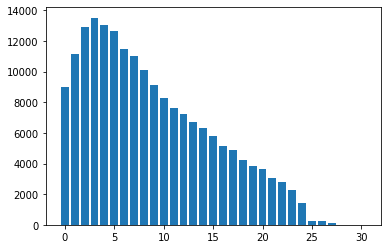

In [63]:
plt.bar(x=rdd_duck_hist_c.keys(), height=rdd_duck_hist_c.values())

Este histograma puede ser muy interesante, ya que nos ayuda a ver cómo la mayoria de estaciones tienen pocas bicis disponibles la mayoría del tiempo (0-10), y prácticamente nunca están llenas.

Ya hemos contestado a nuestras 8 preguntas objetivo sobre el dataset 202106.json obteniendo resultados muy interesantes y que pueden ser verdaderamente útiles en el desarrollo, optimización y expansión de la empresa.

En el siguiente punto estudiaremos el dataset 2021_movements.json

## Dataset 202106_movements.json

Ahora, vamos a plantear distintas consultas y analizar la base de datos "202106_movements.json"

Antes de nada, consideramos conveniente ver, como en el caso anterior, cómo es.

In [64]:
!head -10 202106_movements.json

{"_id": {"$oid": "60bbf3f21b91311d90d568ad"}, "user_day_code": "b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b", "idplug_base": 15, "user_type": 1, "idunplug_base": 13, "travel_time": 319, "idunplug_station": 38, "ageRange": 0, "idplug_station": 54, "unplug_hourTime": "2021-06-01T00:00:00Z", "zip_code": ""}
{"_id": {"$oid": "60bbf3f21b91311d90d568b2"}, "user_day_code": "364b1b99f1f9a1748f7abf1134c8d6a46197b583649308f7c79f35120239c16f", "idplug_base": 7, "user_type": 1, "idunplug_base": 1, "travel_time": 386, "idunplug_station": 185, "ageRange": 0, "idplug_station": 126, "unplug_hourTime": "2021-06-01T00:00:00Z", "zip_code": ""}
{"_id": {"$oid": "60bbf3f21b91311d90d568b3"}, "user_day_code": "5cc17031cba02835dda4b6c153b56572beaade54d8ab91b890368c9a45ca741a", "idplug_base": 14, "user_type": 1, "idunplug_base": 10, "travel_time": 465, "idunplug_station": 15, "ageRange": 0, "idplug_station": 91, "unplug_hourTime": "2021-06-01T00:00:00Z", "zip_code": ""}
{"_id": {"$oid": "6

Para mayor claridad cojamos sólo una observación.

In [65]:
b ='{"_id": {"$oid": "60bbf3f21b91311d90d568ad"}, "user_day_code": "b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b", "idplug_base": 15, "user_type": 1, "idunplug_base": 13, "travel_time": 319, "idunplug_station": 38, "ageRange": 0, "idplug_station": 54, "unplug_hourTime": "2021-06-01T00:00:00Z", "zip_code": ""}'
json.loads(b)

{'_id': {'$oid': '60bbf3f21b91311d90d568ad'},
 'user_day_code': 'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b',
 'idplug_base': 15,
 'user_type': 1,
 'idunplug_base': 13,
 'travel_time': 319,
 'idunplug_station': 38,
 'ageRange': 0,
 'idplug_station': 54,
 'unplug_hourTime': '2021-06-01T00:00:00Z',
 'zip_code': ''}

Transformemos éste también en dataframe para verlo con mayor claridad.

In [66]:
df2 = spark.read.json('202106_movements.json')

In [67]:
df2.printSchema()
df2.show()
df2.count()

root
 |-- _id: struct (nullable = true)
 |    |-- $oid: string (nullable = true)
 |-- ageRange: long (nullable = true)
 |-- idplug_base: long (nullable = true)
 |-- idplug_station: long (nullable = true)
 |-- idunplug_base: long (nullable = true)
 |-- idunplug_station: long (nullable = true)
 |-- travel_time: long (nullable = true)
 |-- unplug_hourTime: string (nullable = true)
 |-- user_day_code: string (nullable = true)
 |-- user_type: long (nullable = true)
 |-- zip_code: string (nullable = true)

+--------------------+--------+-----------+--------------+-------------+----------------+-----------+--------------------+--------------------+---------+--------+
|                 _id|ageRange|idplug_base|idplug_station|idunplug_base|idunplug_station|travel_time|     unplug_hourTime|       user_day_code|user_type|zip_code|
+--------------------+--------+-----------+--------------+-------------+----------------+-----------+--------------------+--------------------+---------+--------+
|{60b

413370

Limpiémoslo un poco para que entre bien en la página y podamos visualizar con mayor claridad los resultados.

In [68]:
df2 = df2.drop('_id','ageRange','zip_code', 'idplug_base', 'idunplug_base')
df2.show()

+--------------+----------------+-----------+--------------------+--------------------+---------+
|idplug_station|idunplug_station|travel_time|     unplug_hourTime|       user_day_code|user_type|
+--------------+----------------+-----------+--------------------+--------------------+---------+
|            54|              38|        319|2021-06-01T00:00:00Z|b67ea824acf706087...|        1|
|           126|             185|        386|2021-06-01T00:00:00Z|364b1b99f1f9a1748...|        1|
|            91|              15|        465|2021-06-01T00:00:00Z|5cc17031cba02835d...|        1|
|           236|              84|        613|2021-06-01T00:00:00Z|6e855acaaa17d6d14...|        1|
|            94|             131|        751|2021-06-01T00:00:00Z|e93417502d5520899...|        1|
|           204|             192|        508|2021-06-01T00:00:00Z|b3db5d2fef1ea149c...|        1|
|            12|              84|        726|2021-06-01T00:00:00Z|14191962ebd5a4b44...|        1|
|           163|    

## Objetivo

Habiendo visto con claridad la forma de las observaciones de esta base de datos, nos parece interesante responder las siguientes preguntas:
1. ¿Qué cantidad de usuarios hay por cada uno de los tipos?
2. ¿Qué viajes se hicieron el día 19 de junio de 2021? ¿Cuántos fueron? ¿Cuántos se hicieron por cada tipo de usuario?
3. ¿Cuántos viajes se han hecho entre las 15:00 y las 18:00? ¿Cuáles fueron y cuanto duraron? De esos, ¿cuántos duraron entre 20 y 30 minutos? ¿Y entre 10 y 15?
4. ¿Cuántos viajes se han realizado de más de 30 minutos? ¿Cuánto han durado de media?
5. Histograma de viajes según su duración.
6. ¿Cuál es la estación con menos salidas y cuántas son?  ¿Cómo son los viajes desde esa estación?
7. ¿Cuántos viajes se han realizado por día? Gráfico de barras.
8. ¿Qué personas han hecho viajes de ida y vuelta? ¿Cuántos han hecho? ¿Cuál ha sido la duración media de éstos?

### 0. Organización de los RDD
Vamos a crear las funciones necesarias para leer bien los RDD y poder hacer las consultas propuestas.

In [69]:
rdd_base_2 = sc.textFile('202106_movements.json')

In [70]:
def mapper(line):
    data = json.loads(line)
    u_t = data['user_type']
    u_c = data['user_day_code']
    start = data['idunplug_station']
    end = data['idplug_station']
    time = data['travel_time']
    date = data['unplug_hourTime']
    return u_t, u_c, start, end, time, date

In [71]:
rdd = rdd_base_2.map(mapper)

In [72]:
rdd.take(3)

[(1,
  'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b',
  38,
  54,
  319,
  '2021-06-01T00:00:00Z'),
 (1,
  '364b1b99f1f9a1748f7abf1134c8d6a46197b583649308f7c79f35120239c16f',
  185,
  126,
  386,
  '2021-06-01T00:00:00Z'),
 (1,
  '5cc17031cba02835dda4b6c153b56572beaade54d8ab91b890368c9a45ca741a',
  15,
  91,
  465,
  '2021-06-01T00:00:00Z')]

Ahora que lo tenemos limpio y organizado como queríamos, podemos ponernos a responder las preguntas.

### 1. ¿Qué cantidad de usuarios hay por cada uno de los tipos?
En el ejemplo que nos ha subido vemos que esto se puede hacer directamente desde los RDD de la siguiente manera.

In [73]:
rdd.countByKey()

defaultdict(int, {1: 391401, 3: 15168, 6: 4847, 2: 1951, 7: 3})

Si queremos seleccionar los usuarios por tipo y contarlos por separado, se haría así.

In [74]:
selected_type = 1
rdd_users = rdd.filter(lambda x: x[0]==selected_type).map(lambda x: (x[1],tuple(x[2:])))

Con el anterior RDD podemos coger un usuario perteneciente al tipo 1 y contar cuántos usuarios pertenecen a ese determinado tipo.

In [75]:
rdd_users.take(1)

[('b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b',
  (38, 54, 319, '2021-06-01T00:00:00Z'))]

In [76]:
rdd_users.count()

391401

Podemos hacerlo también para los usuarios del tipo 2.

In [77]:
selected_type = 2
rdd_users.count()

1951

Y para los del tipo 3.

In [78]:
selected_type = 3
rdd_users.count()

15168

Y para los del tipo 6 y 7 también.

In [79]:
selected_type = 6
rdd_users.count()

4847

In [80]:
selected_type = 7
rdd_users.count()

3

Pero esto ya estaba todo hecho en la práctica de ejemplo, hagámoslo con el dataframe que hemos creado para ver cómo funcionaría.

Comencemos contando cada tipo, como antes.

In [81]:
df2.groupBy('user_type').count().show()

+---------+------+
|user_type| count|
+---------+------+
|        6|  4847|
|        1|391401|
|        3| 15168|
|        2|  1951|
|        7|     3|
+---------+------+



Veamos a ver cómo se haría si queremos seleccionar sólo los del tipo 1.

In [82]:
df2_1 = df2.filter(df2["user_type"]==1)
df2_1.show()
df2_1.count()

+--------------+----------------+-----------+--------------------+--------------------+---------+
|idplug_station|idunplug_station|travel_time|     unplug_hourTime|       user_day_code|user_type|
+--------------+----------------+-----------+--------------------+--------------------+---------+
|            54|              38|        319|2021-06-01T00:00:00Z|b67ea824acf706087...|        1|
|           126|             185|        386|2021-06-01T00:00:00Z|364b1b99f1f9a1748...|        1|
|            91|              15|        465|2021-06-01T00:00:00Z|5cc17031cba02835d...|        1|
|           236|              84|        613|2021-06-01T00:00:00Z|6e855acaaa17d6d14...|        1|
|            94|             131|        751|2021-06-01T00:00:00Z|e93417502d5520899...|        1|
|           204|             192|        508|2021-06-01T00:00:00Z|b3db5d2fef1ea149c...|        1|
|            12|              84|        726|2021-06-01T00:00:00Z|14191962ebd5a4b44...|        1|
|           163|    

391401

Con el resto de tipos se haría exactamente igual, sólo que cambiando el tipo.

In [83]:
df2.filter(df2["user_type"]==2).count()

1951

In [84]:
df2.filter(df2["user_type"]==3).count()

15168

In [85]:
df2.filter(df2["user_type"]==6).count()

4847

In [86]:
df2.filter(df2["user_type"]==7).count()

3

### 2. ¿Qué viajes se hicieron el día 19 de junio de 2021? ¿Cuántos fueron? ¿Cuántos se hicieron por cada tipo de usuario?
Para responder estas preguntas, el formato en el que nos viene la fecha dada no nos sirve, pues también viene la hora del viaje y nos dificultaría el conteo. Debemos crear un nuevo mapeo.

In [87]:
def date_mapper(line):
    data = json.loads(line)
    u_t = data['user_type']
    u_c = data['user_day_code']
    start = data['idunplug_station']
    end = data['idplug_station']
    time = data['travel_time']
    date = datetime.fromisoformat(data['unplug_hourTime'][:-1]).date().isoformat()
    return  date, u_c, u_t, start, end, time

In [88]:
rdd_date = rdd_base_2.map(date_mapper)

In [89]:
rdd_date.take(3)

[('2021-06-01',
  'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b',
  1,
  38,
  54,
  319),
 ('2021-06-01',
  '364b1b99f1f9a1748f7abf1134c8d6a46197b583649308f7c79f35120239c16f',
  1,
  185,
  126,
  386),
 ('2021-06-01',
  '5cc17031cba02835dda4b6c153b56572beaade54d8ab91b890368c9a45ca741a',
  1,
  15,
  91,
  465)]

Como hemos colocado la fecha en primer lugar, podríamos hacer un countByKey para ver exactamente cuántos viajes se hicieron cada día.

In [90]:
rdd_date.countByKey()

defaultdict(int,
            {'2021-06-01': 14962,
             '2021-06-02': 16197,
             '2021-06-03': 17406,
             '2021-06-04': 16321,
             '2021-06-05': 9074,
             '2021-06-06': 10037,
             '2021-06-07': 14565,
             '2021-06-08': 16499,
             '2021-06-09': 17249,
             '2021-06-10': 17483,
             '2021-06-11': 14773,
             '2021-06-12': 12236,
             '2021-06-13': 10312,
             '2021-06-14': 14583,
             '2021-06-15': 16276,
             '2021-06-16': 14054,
             '2021-06-17': 10958,
             '2021-06-18': 14779,
             '2021-06-19': 11317,
             '2021-06-20': 7871,
             '2021-06-21': 13649,
             '2021-06-22': 12905,
             '2021-06-23': 15934,
             '2021-06-24': 15876,
             '2021-06-25': 15158,
             '2021-06-26': 11100,
             '2021-06-27': 9033,
             '2021-06-28': 13372,
             '2021-06-29': 14454,


Como sólo queremos ver cuántos viajes se hicieron el 19 de junio realizamos el siguiente filter.

In [91]:
selected_date = '2021-06-19'
rdd_dateselected = rdd_date.filter(lambda x: x[0]==selected_date).map(lambda x: (x[1],x[2:]))

Para ver, como queremos, cuáles fueron los viajes realizados en esa fecha, realizamos un collect.

In [92]:
rdd_dateselected.collect()

[('314a07d84bb18eb39d6bfe8eeb467ebf4f14950d80c4c98bfdc5d2d8e5caf9c6',
  (2, 110, 112, 101)),
 ('db6897d4f4b3793b57f1f85776f51ff4c2877f7ff63f3f16a1c70ce389ab3c4e',
  (1, 169, 16, 232)),
 ('26097d70c0f94c34afb456955d363d28acca77be44f01c4ddd5998f47c172234',
  (1, 54, 180, 256)),
 ('6b3d73dc1bd57390f07a646993b427f628fd02175007f074ac4cbaf396f41dd1',
  (1, 71, 177, 379)),
 ('314a07d84bb18eb39d6bfe8eeb467ebf4f14950d80c4c98bfdc5d2d8e5caf9c6',
  (2, 111, 90, 421)),
 ('c4de0cfeb6912912c0ee93ae9223ca3f19662213766c1ac03bd4ea18bea4676f',
  (1, 212, 213, 183)),
 ('0da1453918673176f9207aa1f26582b007e188db034021a6c8b6431beb4d689d',
  (1, 30, 57, 507)),
 ('98154bc48fc0bf4e61ef9029bc238529e2bb24fb4442f4366a5d5148926c818d',
  (1, 217, 213, 673)),
 ('be5032aaa534179bf3e8a3ce56319c93aff7fe98012a53f2d0c96a4f989009ec',
  (1, 217, 213, 656)),
 ('60a3b4449523a0a561db512bc2a7bdcbb2540b0693cefe4e4256a998090d2601',
  (1, 53, 52, 116)),
 ('b20fd733fab4a39a95ae09873bd7314ff5d01b24d23fa0770a4d4b59af2a51d9',
  (1, 51

Y para contarlos, basta hacer el count. Comprobamos que nos sale lo mismo que cuando hicimos el countByKey.

In [93]:
rdd_dateselected.count()

11317

Nos piden ahora que veamos cuántos de esos viajes se hicieron por tipo de usuario. Deberemos reorganizar la estructura de los datos para poder hacer un countByKey.

In [94]:
selected_date = '2021-06-19'
rdd_dateselected_byuser = rdd_date.filter(lambda x: x[0]==selected_date).map(lambda x: (x[2],x[1],x[3:]))

In [95]:
rdd_dateselected_byuser.take(1)

[(2,
  '314a07d84bb18eb39d6bfe8eeb467ebf4f14950d80c4c98bfdc5d2d8e5caf9c6',
  (110, 112, 101))]

Con el tipo de usuario ya colocado en primer lugar hacemos el countByKey mencionado y obtenemos la cantidad de viajes por tipo de usuario que se hicieron el día 19 de junio de 2021.

In [96]:
rdd_dateselected_byuser.countByKey()

defaultdict(int, {2: 108, 1: 10809, 6: 261, 3: 139})

### 3. ¿Cuántos viajes se han hecho entre las 15:00 y las 18:00? ¿Cuáles fueron y cuanto duraron? De esos, ¿cuántos duraron entre 20 y 30 minutos? ¿Y entre 10 y 15?

Al igual que con las preguntas anteriores, ahora tenemos el problema de que en los mapeos anteriores aparece siempre la fecha de los viajes, y esto es algo que no nos interesa. Realizaremos un nuevo mapeo que separe la hora del resto de la fecha.

In [97]:
def time_mapper(line):
    data = json.loads(line)
    u_t = data['user_type']
    u_c = data['user_day_code']
    start = data['idunplug_station']
    end = data['idplug_station']
    time = data['travel_time']
    hour = datetime.fromisoformat(data['unplug_hourTime'][:-1]).time().isoformat()
    return  hour, u_c, u_t, start, end, time

In [98]:
rdd_time = rdd_base_2.map(time_mapper)

Podemos, si queremos, ver cuántos viajes se han hecho por hora.

In [99]:
rdd_time.countByKey()

defaultdict(int,
            {'00:00:00': 3830,
             '01:00:00': 2285,
             '02:00:00': 1573,
             '03:00:00': 1686,
             '04:00:00': 3071,
             '05:00:00': 12279,
             '06:00:00': 24698,
             '07:00:00': 22677,
             '08:00:00': 16356,
             '09:00:00': 16821,
             '10:00:00': 17625,
             '11:00:00': 20897,
             '12:00:00': 28564,
             '13:00:00': 25432,
             '14:00:00': 23051,
             '15:00:00': 25645,
             '16:00:00': 32095,
             '17:00:00': 33297,
             '18:00:00': 30002,
             '19:00:00': 20746,
             '20:00:00': 15310,
             '21:00:00': 14610,
             '22:00:00': 12519,
             '23:00:00': 8301})

Como nos piden los viajes entre las 15:00 y las 18:00, debemos sólo tener en cuenta los viajes realizados a las 15, 16 y 17 horas. Realizaremos el siguiente filter.

In [100]:
times = ['15:00:00', '16:00:00', '17:00:00']
rdd_timeselected = rdd_time.filter(lambda x: x[0] in times).map(lambda x: (x[1],x[2:]))

In [101]:
rdd_timeselected.take(3)

[('36de320b4fc2399d46d1e3d205848339286ef24f379c71384bab819988bd98c8',
  (3, 142, 142, 34)),
 ('624afe5d27f6628d0fa8bfc61e77f2446a768fae24d46b720ff3c647de9e8329',
  (1, 129, 183, 129)),
 ('208bf3c22af54efd0768ddc5b7649c597254c87b2a20cb0db2b51e726ad9d797',
  (3, 179, 179, 4))]

Como queremos saber cuantos son, hagamos un count.

In [102]:
rdd_timeselected.count()

91037

Observemos que 25645 + 32095 + 33297 = 91037. Por lo que parece que lo hemos hecho bien.

Queremos saber qué viajes fueron y cuánto duraron. Bastaría hacer un collect, pero para que quede más organizada la información, vamos a hacer primero un map para que sólo nos devuelva el id del usuario y el tiempo del viaje.

In [103]:
rdd_timeselected_duration = rdd_timeselected.map(lambda x: (x[0], x[1][3]))

In [104]:
rdd_timeselected_duration.take(3)

[('36de320b4fc2399d46d1e3d205848339286ef24f379c71384bab819988bd98c8', 34),
 ('624afe5d27f6628d0fa8bfc61e77f2446a768fae24d46b720ff3c647de9e8329', 129),
 ('208bf3c22af54efd0768ddc5b7649c597254c87b2a20cb0db2b51e726ad9d797', 4)]

Para saber cuántos duraron entre 20 y 30 minutos (1200 y 1800 segundos), realizaremos un nuevo filter y un count.

In [105]:
mintime = 1200
maxtime = 1800
rdd_timeselected_durationselected = rdd_timeselected_duration.filter(lambda x: mintime <= x[1] <= maxtime)

In [106]:
rdd_timeselected_durationselected.take(3)

[('a7e25ffaef5cc0125621fc122d4e4dac254b6c7eae948493ae26228292b4510b', 1267),
 ('65abb515d9c6f37c904a91ee5973a4f148c0658aecc6a1422fc42fb4816d0f19', 1315),
 ('e3a865b6b1f776bfd02ba31da5dc2a808fb815106c16b4edb2e69702e143c4c4', 1428)]

In [107]:
rdd_timeselected_durationselected.count()

12299

Observemos que lo bueno que tiene esto es que podemos elegir el intervalo que queramos sólo cambiando el mintime y el maxtime, sin necesidad de cambiar el RDD, pues éste no se evalúa.

Por lo que para saber la cantidad de viajes entre 10 y 15 minutos (600 y 900 segundos) basta hacer lo siguiente.

In [108]:
mintime = 600
maxtime = 900
rdd_timeselected_durationselected.count()

24341

### 4. ¿Cuántos viajes se han realizado de más de 30 minutos? ¿Cuánto han durado de media?

Volvemos a utilizar el RDD creado con el primer mapeo.

In [109]:
rdd.take(3)

[(1,
  'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b',
  38,
  54,
  319,
  '2021-06-01T00:00:00Z'),
 (1,
  '364b1b99f1f9a1748f7abf1134c8d6a46197b583649308f7c79f35120239c16f',
  185,
  126,
  386,
  '2021-06-01T00:00:00Z'),
 (1,
  '5cc17031cba02835dda4b6c153b56572beaade54d8ab91b890368c9a45ca741a',
  15,
  91,
  465,
  '2021-06-01T00:00:00Z')]

Hagamos un filter para obtener sólo los viajes de más de 30 minutos (1800 segundos).

In [110]:
minduration = 1800
rdd_durationfiltered = rdd.filter(lambda x: x[4] >= minduration).map(lambda x: (x[4]))

In [111]:
rdd_durationfiltered.take(3)

[2188, 2001, 2024]

Para saber cuántos viajes de más de 30 min hay, bastará contarlos con count. Lo guardamos en una variable pues la vamos a utilizar después para calcular la media de minutos por viaje.

In [112]:
total = rdd_durationfiltered.count()
total

29639

Para calcular la media de minutos por viaje, utilizaremos la función importada al principio add junto con un reduce para obtener la suma total y dividiremos entre el número total de viajes de más de 30 minutos, calculados antes. Lo pasaremos a minutos dividiendo entre 60 para que quede mejor.

In [113]:
media = (rdd_durationfiltered.reduce(add)/total)/60
media

79.04401689215784

### 5. Histograma de viajes según su duración.
Reorganicemos el RDD original para que sólo contenga la duración de los viajes y el id del usuario.

In [114]:
rdd_duration = rdd.map(lambda x: (x[4], x[1]))

In [115]:
rdd_duration.take(3)

[(319, 'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b'),
 (386, '364b1b99f1f9a1748f7abf1134c8d6a46197b583649308f7c79f35120239c16f'),
 (465, '5cc17031cba02835dda4b6c153b56572beaade54d8ab91b890368c9a45ca741a')]

De esta manera, basta hacer un countByKey para obtener los datos del histograma que queremos.

In [116]:
dict_duration = rdd_duration.countByKey()
dict_duration

defaultdict(int,
            {319: 300,
             386: 354,
             465: 413,
             613: 410,
             751: 384,
             508: 383,
             726: 417,
             536: 438,
             397: 364,
             516: 459,
             697: 374,
             1054: 247,
             135: 51,
             874: 281,
             1031: 234,
             1007: 226,
             328: 315,
             641: 381,
             223: 141,
             791: 390,
             787: 345,
             667: 392,
             916: 325,
             832: 319,
             464: 367,
             946: 282,
             900: 303,
             799: 307,
             1018: 234,
             355: 356,
             455: 421,
             302: 315,
             202: 150,
             1014: 220,
             1500: 74,
             578: 452,
             259: 199,
             361: 349,
             717: 389,
             564: 381,
             958: 256,
             272: 235,
             

Para visualizarlo utilizamos la librería matplotlib.pyplot importada al principio del documento.

<BarContainer object of 9144 artists>

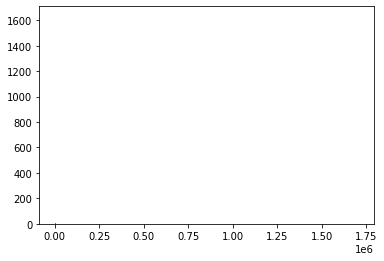

In [117]:
plt.bar(x=dict_duration.keys(), height=dict_duration.values())

Observemos que se nos presenta un problema, hay demasiadas clases como para que python pueda dibujarlo correctamente. Por lo que vamos a agrupar los tiempos de viaje en subgrupos de tamaño 100. De forma que los viajes que duren entre 0 y 50 segundos irán al grupo 0, los que duren entre 50 y 150 segundos al del grupo 1, los que duren entre 150 y 250 segundos al del grupo 2 y así con todos. Vemos también que hay tiempos de viaje superiores a 20000 segundos (es, decir, de 5 horas de trayecto) como no tienen mucho sentido los eliminaremos del histograma. Recurriremos a la función round de python para hacer esto. Crearemos otro RDD a partir del anterior con los datos redondeados.

In [118]:
rdd_duration_rounded = rdd_duration.filter(lambda x: x[0] < 20000).map(lambda x: (round(x[0],-2)/100, x[1]))

In [119]:
rdd_duration_rounded.take(10)

[(3.0, 'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b'),
 (4.0, '364b1b99f1f9a1748f7abf1134c8d6a46197b583649308f7c79f35120239c16f'),
 (5.0, '5cc17031cba02835dda4b6c153b56572beaade54d8ab91b890368c9a45ca741a'),
 (6.0, '6e855acaaa17d6d14236598c0f1172c783e16950e39c01e678209fa002568094'),
 (8.0, 'e93417502d55208995a61f4177956ab9289aba39044ce3e1fea059ac0687f51c'),
 (5.0, 'b3db5d2fef1ea149cd83fff2a93fd5ff9b8f358e481d78027fb5b1b33087fc13'),
 (7.0, '14191962ebd5a4b4480d7befff011738b70c7a40fc4cbfab406813e32bf42260'),
 (5.0, '2786fa7033a6e0e9efd7f0a585a4378c94f7937b8f229cafc04a82dd6e7f19a1'),
 (4.0, 'c5d58832c8f4cba6b6beb457b404233fa17e8053ab14833a8765c2f0c773023e'),
 (5.0, '9d51c3d02145302d116b933822692c378f66b154dd655667be594a7b45effcf3')]

Ya podemos agruparlos como antes y visualizarlos.

In [120]:
dict_duration = rdd_duration_rounded.countByKey()
dict_duration

defaultdict(int,
            {3.0: 26411,
             4.0: 37275,
             5.0: 41316,
             6.0: 41852,
             8.0: 34509,
             7.0: 38182,
             11.0: 20317,
             1.0: 3258,
             9.0: 29398,
             10.0: 25699,
             2.0: 13390,
             15.0: 8011,
             17.0: 4715,
             13.0: 13072,
             12.0: 16418,
             14.0: 10578,
             22.0: 1411,
             20.0: 2052,
             0.0: 11005,
             16.0: 6426,
             18.0: 3627,
             26.0: 852,
             81.0: 52,
             29.0: 705,
             23.0: 1149,
             19.0: 2603,
             43.0: 273,
             52.0: 238,
             21.0: 1681,
             34.0: 666,
             31.0: 607,
             32.0: 602,
             25.0: 919,
             30.0: 647,
             28.0: 702,
             44.0: 244,
             24.0: 1046,
             35.0: 514,
             71.0: 95,
             37.0: 3

<BarContainer object of 201 artists>

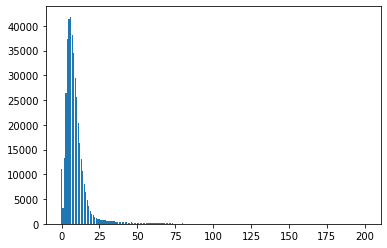

In [121]:
plt.bar(x=dict_duration.keys(), height=dict_duration.values())

Vemos que la gran mayoría de los datos se encuentran entre los grupos 0 y 40. Hagamos un filtro de esos datos y representémoslos para verlo mejor.

In [122]:
rdd_duration_filtered = rdd_duration_rounded.filter(lambda x: x[0] <= 40)

In [123]:
dict_duration_filt = rdd_duration_filtered.countByKey()
dict_duration_filt

defaultdict(int,
            {3.0: 26411,
             4.0: 37275,
             5.0: 41316,
             6.0: 41852,
             8.0: 34509,
             7.0: 38182,
             11.0: 20317,
             1.0: 3258,
             9.0: 29398,
             10.0: 25699,
             2.0: 13390,
             15.0: 8011,
             17.0: 4715,
             13.0: 13072,
             12.0: 16418,
             14.0: 10578,
             22.0: 1411,
             20.0: 2052,
             0.0: 11005,
             16.0: 6426,
             18.0: 3627,
             26.0: 852,
             29.0: 705,
             23.0: 1149,
             19.0: 2603,
             21.0: 1681,
             34.0: 666,
             31.0: 607,
             32.0: 602,
             25.0: 919,
             30.0: 647,
             28.0: 702,
             24.0: 1046,
             35.0: 514,
             37.0: 392,
             38.0: 337,
             33.0: 607,
             39.0: 307,
             40.0: 362,
             27.0:

<BarContainer object of 41 artists>

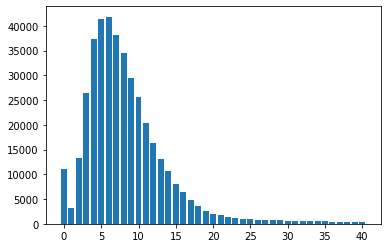

In [124]:
plt.bar(x=dict_duration_filt.keys(), height=dict_duration_filt.values())

Tras filtrar los grupos menores a 40, vemos cómo la mayoría se acumulan entre los grupos 5 y 10. Una buena idea sería realizar ofertas de si se hacen 10 viajes te regalamos el siguiente o alguna otra oferta del estilo que se ajuste a la disposición de viajes por usuario que hemos podido observar gracias a esta consulta.

### 6.  ¿Cuál es la estación con menos salidas y cuántas son?  ¿Cómo son los viajes desde esa estación?

Reorganicemos el RDD original para que contenga el id de la estación de salida y el id de usuario.

In [125]:
rdd_less = rdd.map(lambda x: (x[2], x[1]))

In [126]:
rdd_less.take(2)

[(38, 'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b'),
 (185, '364b1b99f1f9a1748f7abf1134c8d6a46197b583649308f7c79f35120239c16f')]

In [127]:
rdd_less_k = rdd_less.countByKey()
rdd_less_k

defaultdict(int,
            {38: 2820,
             185: 1677,
             15: 2255,
             84: 1932,
             131: 2277,
             192: 1696,
             208: 3648,
             117: 931,
             137: 1273,
             207: 1666,
             103: 2114,
             16: 1708,
             149: 2998,
             5: 1136,
             112: 949,
             26: 2705,
             145: 2254,
             41: 2977,
             7: 1759,
             154: 1517,
             196: 1130,
             226: 1382,
             12: 1597,
             56: 2268,
             10: 1787,
             55: 2202,
             79: 2263,
             109: 726,
             156: 1645,
             132: 3524,
             214: 1552,
             96: 1685,
             125: 1364,
             157: 2067,
             213: 1622,
             3: 1696,
             219: 1587,
             175: 3719,
             181: 1740,
             86: 2016,
             20: 1429,
             13: 3091,

Veamos cuál es el mínimo número de salidas.

In [128]:
min(list(rdd_less_k.values()))

22

Parece que hay una estación con únicamente 22 salidas. Veamos cúal es.

In [129]:
list(rdd_less_k.values()).index(22)

262

In [130]:
list(rdd_less_k.keys())[262]

2009

La estación de salida con menos viajes es la de id 2009, en la que solo se han producido 22 salidas. Vamos a ver ahora cómo son los viajes desde la misma.

In [131]:
rdd_less_info = rdd.filter(lambda x: x[2]==2009).map(lambda x: (x[1],x[3],x[4]))

In [132]:
rdd_less_info.collect()

[('4062d067009fd3fdd6d29bdf856c9436bd5914ce0d7a5295709519f4ea929343', 2009, 8),
 ('4062d067009fd3fdd6d29bdf856c9436bd5914ce0d7a5295709519f4ea929343',
  2009,
  2583),
 ('4062d067009fd3fdd6d29bdf856c9436bd5914ce0d7a5295709519f4ea929343',
  154,
  21992),
 ('f26e43b052cadfb75720d8f95442cb15ab332b2c4dc9e0a88e6091ad8e884cea',
  269,
  1607),
 ('f26e43b052cadfb75720d8f95442cb15ab332b2c4dc9e0a88e6091ad8e884cea',
  101,
  2265),
 ('f26e43b052cadfb75720d8f95442cb15ab332b2c4dc9e0a88e6091ad8e884cea',
  267,
  2563),
 ('10f9143f970a7b82e64984ef96937528d1d605f00ac60e7b1732fce84b0c93f0',
  2009,
  842),
 ('3638af59aa29536c57c6b12c2d1291ba9d163b00ec2a59312bdd58b405150dbc',
  2009,
  65),
 ('175998ed5b7b8483d017823619efa172506b44ad091b0c555aa501f06c740d7e',
  2009,
  12),
 ('175998ed5b7b8483d017823619efa172506b44ad091b0c555aa501f06c740d7e',
  200,
  3953),
 ('d6adc37cb81dc9876595d85a6958e2321c7088f3968e1b0afbf686c716063be5',
  141,
  5809),
 ('91bbbc26438de876099eb07b1ce8b04fc99357c73b2d29484c6f1fbe5

La mayoría de los viajes desde la estación 2009 acaban regresando a la misma y son de duraciones cortas.

### 7. ¿Cuántos viajes se han realizado por día? Gráfico de barras.

Utilizaremos el rdd llamado rdd_date creado con el mapeo de la pregunta 2 para realizar esta consulta.

In [133]:
rdd_travel_day = rdd_date.countByKey()
rdd_travel_day

defaultdict(int,
            {'2021-06-01': 14962,
             '2021-06-02': 16197,
             '2021-06-03': 17406,
             '2021-06-04': 16321,
             '2021-06-05': 9074,
             '2021-06-06': 10037,
             '2021-06-07': 14565,
             '2021-06-08': 16499,
             '2021-06-09': 17249,
             '2021-06-10': 17483,
             '2021-06-11': 14773,
             '2021-06-12': 12236,
             '2021-06-13': 10312,
             '2021-06-14': 14583,
             '2021-06-15': 16276,
             '2021-06-16': 14054,
             '2021-06-17': 10958,
             '2021-06-18': 14779,
             '2021-06-19': 11317,
             '2021-06-20': 7871,
             '2021-06-21': 13649,
             '2021-06-22': 12905,
             '2021-06-23': 15934,
             '2021-06-24': 15876,
             '2021-06-25': 15158,
             '2021-06-26': 11100,
             '2021-06-27': 9033,
             '2021-06-28': 13372,
             '2021-06-29': 14454,


Hagamos el gráfico de barras para así, a simple vista, poder ver qué días se han realizado más viajes.

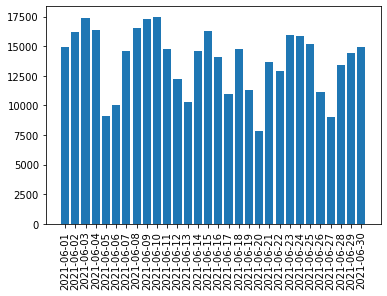

In [134]:
plt.bar(x=rdd_travel_day.keys(), height=rdd_travel_day.values(),)
plt.xticks(rotation=90)
plt.show()

Con esto, podemos ver cómo el número de viajes varía mucho según el día, abarcando un rango de unos 7800 viajes diaros hasta los 18000. Lo que sí se puede observar de forma más o menos clara es que se repite el patrón de haber menos viajes en fin de semana que entre semana.

### 8. ¿Cuántas personas han hecho viajes de ida y vuelta? ¿En qué estaciones ha ocurrido más a menudo? ¿Cuál ha sido la duración media de éstos?

In [135]:
rdd.take(1)

[(1,
  'b67ea824acf706087d5818ebc6f90821a5abaab17a08688513e389dd87350b9b',
  38,
  54,
  319,
  '2021-06-01T00:00:00Z')]

In [136]:
rdd_round_trip = rdd.filter(lambda x: x[2]==x[3]).map(lambda x: (x[2],x[1],x[3],x[4]))

In [137]:
rdd_round_trip.collect()

[(49,
  '2767e26b0e338591b66d0e1190aea5db600172513b58b15fe0a477730ff00204',
  49,
  1417),
 (183,
  '6a8853f9ff151a85dde217261d8cdb467cca719164f91950ffe4926a6a7f7614',
  183,
  11),
 (58,
  '9723594fa97e776087463dab291547ea18d7ddb762fca7e9ffb6fd9cd2d51c55',
  58,
  671),
 (45,
  '9723594fa97e776087463dab291547ea18d7ddb762fca7e9ffb6fd9cd2d51c55',
  45,
  2328),
 (159,
  'a65cd774bab6225f887a80489e096659fb4312b36648b1a15b6e417c9d5e1f87',
  159,
  279),
 (16,
  'e8476bae0a3e27c9a7056d231f610d91aef7e2e0d222f2f15da141fb0dc98a9d',
  16,
  3),
 (16,
  'e8476bae0a3e27c9a7056d231f610d91aef7e2e0d222f2f15da141fb0dc98a9d',
  16,
  3),
 (163,
  'd3790841b6ef31743518792244dbe7e6c7af17eccb48359fd28c3a25e9fe545e',
  163,
  795),
 (79,
  '442a68fca7f65ec0283d69c93e00642834a8df247378ada18c218ada300c6a9c',
  79,
  11),
 (79,
  '442a68fca7f65ec0283d69c93e00642834a8df247378ada18c218ada300c6a9c',
  79,
  11),
 (62,
  '91d6117ed1eab22b50746195d1d8cfbaf17efb684d983bff21b01c1ff3d822ae',
  62,
  2066),
 (17,
  

In [138]:
print(rdd_round_trip.count(), 'personas han hecho viajes de ida y vuelta')

20749 personas han hecho viajes de ida y vuelta


In [139]:
rdd_round_trip.countByKey()

defaultdict(int,
            {49: 115,
             183: 117,
             58: 130,
             45: 132,
             159: 45,
             16: 68,
             163: 86,
             79: 60,
             62: 50,
             17: 86,
             38: 141,
             132: 249,
             177: 113,
             190: 56,
             19: 65,
             116: 62,
             76: 127,
             35: 123,
             77: 90,
             148: 39,
             226: 82,
             118: 66,
             134: 68,
             178: 86,
             92: 49,
             193: 60,
             39: 103,
             5: 63,
             26: 78,
             170: 52,
             227: 65,
             100: 56,
             9: 95,
             210: 99,
             229: 70,
             149: 115,
             52: 118,
             228: 88,
             10: 77,
             218: 57,
             139: 95,
             233: 79,
             187: 108,
             48: 139,
             234: 82,
 

Con esto vemos que hay varias estaciones en las que es común que se hagan a veces viajes de ida y vuelta, produciendose más de 200 veces en algunas.

Calculemos y mostremos el tiempo medio de los viajes de ida y vuelta de cada estación.

In [140]:
rdd_round_mean = rdd.filter(lambda x: x[2]==x[3]).map(lambda x: (x[2],x[4])).groupByKey().mapValues(lambda x: (sum(x)/len(x)))

In [141]:
rdd_round_mean.collect()

[(16, 2684.1029411764707),
 (132, 3599.598393574297),
 (116, 1693.241935483871),
 (76, 660.3070866141733),
 (148, 891.8717948717949),
 (92, 896.6122448979592),
 (100, 1169.7857142857142),
 (52, 1454.415254237288),
 (228, 1110.4772727272727),
 (48, 1750.3237410071943),
 (236, 1503.0555555555557),
 (188, 678.2117647058824),
 (184, 1113.8372093023256),
 (64, 2414.0725388601036),
 (96, 1247.7719298245613),
 (4, 2902.3797468354433),
 (204, 1768.1416666666667),
 (164, 865.5873015873016),
 (140, 2110.181818181818),
 (260, 2184.2315789473682),
 (56, 1453.5656565656566),
 (8, 1656.1475409836066),
 (220, 2371.6783216783215),
 (180, 903.69),
 (136, 1018.8539325842696),
 (80, 1451.452380952381),
 (108, 327.8),
 (224, 3167.817073170732),
 (212, 1316.6306306306305),
 (232, 2403.0),
 (168, 1027.1565217391305),
 (72, 1660.4698795180723),
 (240, 1409.1052631578948),
 (88, 1187.5),
 (200, 271.4418604651163),
 (244, 1425.4888888888888),
 (12, 2851.775),
 (40, 1253.135593220339),
 (264, 992.0275229357799)

## Conclusiones

Tras haber resuelto preguntas de interés a partir de las dos bases de datos (previamente analizandolas y realizando pequeños cambios que nos ayudarían a trabajar con ellas), hemos sido capaces de ver la gran utilidad y valor que tiene esta asignatura para ayudar al rendimiento óptimo de empresas, en este caso, Bicimad.

El trabajo ha sido muy satisfactorio puesto que hemos sido capaces de resolver cada una de las preguntas objetivo, es decir, un total de 16 preguntas, algunas con mayor dificultad, pero lo hemos conseguido. 

En cuanto a los resultados obtenidos, se han ido comentando a lo largo de este notebook y se han ido planteando posibles preguntas extras. Por ejemplo, otra a resolver podría ser: ¿Desde qué tres estaciones se inician más viajes? o ¿En cuales tres se concluyen más trayectos? que podría dejarse como futura continuación.